### Global aggregates of local explanations

In this notebook someone canexpect to find functions and methods to calculate and visualize global aggregates of local explanations for emotion and genre models on the Music4All dataset and for genre models for the AudiSet dataset, as well as a comparison of the global aggregates for the two datasets.

To run further experiments and visualizations someone should have feature weights and feature counts, that is sum of weights of features per class as well as the number of appearances of that feature. You can find those in the repository. Glove embeddings and label encoders are also necessary to visualize the results.

The outline of this notebook is as follows. First we define some necessary functions and variables to calculate and presend the aggregates. Then we proceed with lyrics, audio and multimodal modalities for both tasks for m4a dataset. We then test the results on audioset and finaly compare the two datasets.

In [55]:
import math
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch
import inflect
import itertools

In [11]:
train_df = pd.read_json('../Datasets/music4all/music4all/final_split/train.json', lines=True)
test_df = pd.read_json('../Datasets/music4all/music4all/final_split/test.json', lines=True)

genre_label_encoder = LabelEncoder()
genre_label_encoder.fit_transform(train_df['primary_short'])

emotion_label_encoder = LabelEncoder()
emotion_label_encoder.fit_transform(train_df['emotion'])

present_genres = ["electronic", "folk", "heavy music", "hip hop", "pop", "rhythm music", "rock_altrock_punk"]
secondary_label_encoder = LabelEncoder()
secondary_label_encoder.fit(present_genres)

LabelEncoder()

In [3]:
def load_glove_embeddings(path):
    embeddings_dict = {}
    with open(path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], "float32")
            embeddings_dict[word] = vector
    return embeddings_dict

glove_path = "../Datasets/glove.42B.300d/glove.42B.300d.txt"
glove_embeddings = load_glove_embeddings(glove_path)

In [4]:
def calculate_feature_influences(feature_weights, feature_counts):
    Icj_LIME = {c: {j: math.sqrt(weight) for j, weight in features.items()} for c, features in feature_weights.items()}
    Icj_AVG = {
        c: {j: feature_weights[c][j] / feature_counts[c][j] if feature_counts[c][j] > 0 else 0 for j in feature_weights[c]}
        for c in feature_weights
    }

    total_feature_importance = {}
    for c in Icj_LIME:
        for j in Icj_LIME[c]:
            if j in total_feature_importance:
                total_feature_importance[j] += Icj_LIME[c][j]
            else:
                total_feature_importance[j] = Icj_LIME[c][j]

    p_cj = {
        c: {j: Icj_LIME[c][j] / total_feature_importance[j] if total_feature_importance[j] > 0 else 0 for j in Icj_LIME[c]}
        for c in Icj_LIME
    }
    H_j = {
        j: -sum(p_cj[c].get(j, 0) * math.log(p_cj[c].get(j, 0), 2) if p_cj[c].get(j, 0) > 0 else 0 for c in p_cj)
        for j in set(j for c in p_cj for j in p_cj[c])
    }
    H_min = min(H_j.values())
    H_max = max(H_j.values())
    
    Icj_H = {c: {j: (1 - (H_j[j] - H_min) / (H_max - H_min)) * Icj_LIME[c][j] for j in Icj_LIME[c]} for c in Icj_LIME}
    
    return Icj_LIME, Icj_AVG, Icj_H

In [5]:
def plot_feature_importance(importance_scores, glove_embeddings, label_encoder, N=5, repo_path='output'):
    
    top_features_per_class = {
        label_encoder.inverse_transform([label])[0]: sorted(importance_scores[label].items(), key=lambda x: x[1], reverse=True)[:N]
        for label in importance_scores
    }

    unique_features = list({feature for label in top_features_per_class for feature, _ in top_features_per_class[label] if feature in glove_embeddings})
    embeddings = np.array([glove_embeddings[feature] for feature in unique_features if feature in glove_embeddings])
#     print(len(embeddings))
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 10))
    markers = ['o', 's', '^', 'p', '*', 'D', 'X', '<', '>']
    colors = ['#373e40', '#488286', '#408D7B', '#5AB894', '#868095', '#AA5D78', '#D7ABBB', '#B7D5D4' , '#F9F871']

    for (x, y), word in zip(reduced_embeddings, unique_features):
        plt.scatter(x, y, alpha=0)
        plt.text(x, y, word, fontsize=12, ha='center', va='center')

        word_classes = [label for label, items in top_features_per_class.items() if any(item[0] == word for item in items)]
        angles = np.linspace(0, 2 * np.pi, len(word_classes) + 1)

        for i, label in enumerate(word_classes):
            dy, dx = np.cos(angles[i]) * 0.005, np.sin(angles[i]) * 0.05
            class_index = label_encoder.transform([label])[0]
            marker = markers[class_index % len(markers)]
            color = colors[class_index % len(colors)]
            plt.scatter(x + dx, y + dy, marker=marker, color=color, s=100)

    # plt.xlabel('Dimension 1')
    # plt.ylabel('Dimension 2')
    plt.xticks([])
    plt.yticks([])
    plt.title('2D Visualization of Word Embeddings by Class Importance')
    legend_entries = [plt.Line2D([0], [0], marker=markers[i], color='w', markerfacecolor=colors[i], markersize=10, label=label_encoder.classes_[i]) for i in range(len(label_encoder.classes_))]
    plt.legend(handles=legend_entries, loc='lower right', ncol=2, framealpha=0)
#     plt.savefig(f"{repo_path}")
    plt.show()


In [6]:
def plot_word_embeddings(top_features_per_class, glove_embeddings, selected_classes, label_encoder, repo_path):
    all_words = []
    all_embeddings = []
    all_labels = []

    for label, features in top_features_per_class.items():
        if label in selected_classes:
            for word, weight in features:
                if word in glove_embeddings:
                    all_words.append(word)
                    all_embeddings.append(glove_embeddings[word])
                    all_labels.append(label)

    all_embeddings = np.array(all_embeddings)
    tsne = TSNE(n_components=2, random_state=0)
    reduced_embeddings = tsne.fit_transform(all_embeddings)
    plt.figure(figsize=(12, 10))
    unique_labels = list(set(all_labels))
    markers = ['o', 's', '^', 'p', '*', 'D', 'X', '<', '>']
    colors = ['#373e40', '#488286', '#408D7B', '#5AB894', '#868095', '#AA5D78', '#D7ABBB', '#B7D5D4', '#F9F871']
    colorindexes = label_encoder.transform(unique_labels)
    for i, label in enumerate(unique_labels):
        indices = [index for index, l in enumerate(all_labels) if l == label]
        plt.scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], label=label, marker=markers[colorindexes[i] % len(markers)], color=colors[colorindexes[i] % len(markers)], s= 100)

    for i, word in enumerate(all_words):
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=12, xytext=(0, 5), textcoords='offset points')
    plt.xticks([])
    plt.yticks([])
    # plt.title('2D Visualization of Word Embeddings by Class Importance')
    plt.legend()
#     plt.savefig(f"{repo_path}")
    plt.show()

In [38]:
# Someone could experiment with normalization of word features.
# p = inflect.engine()

# def normalize_feature(feature):
#     feature = feature.lower()
#     return feature

from nltk.stem import WordNetLemmatizer
import nltk

nltk.download('wordnet')
nltk.download('omw-1.4')

lemmatizer = WordNetLemmatizer()

def normalize_feature(feature):
    feature = feature.lower()

    normalized_word = lemmatizer.lemmatize(feature, 'v')
    if normalized_word == feature:
        normalized_word = lemmatizer.lemmatize(feature, 'n')
    
    return normalized_word

def merge_features_by_class(feature_dict):
    merged_dict = defaultdict(lambda: defaultdict(float))
    
    for class_label, features in feature_dict.items():
        temp_dict = defaultdict(float)
        
        for feature, value in features.items():
            normalized_feature = normalize_feature(feature)
            temp_dict[normalized_feature] += value
        
        merged_dict[class_label] = temp_dict
    
    return merged_dict

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\OWNER\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\OWNER\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


## Lyrics Emotion (m4a)

In [18]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('emotion_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('emotion_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)

In [19]:
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

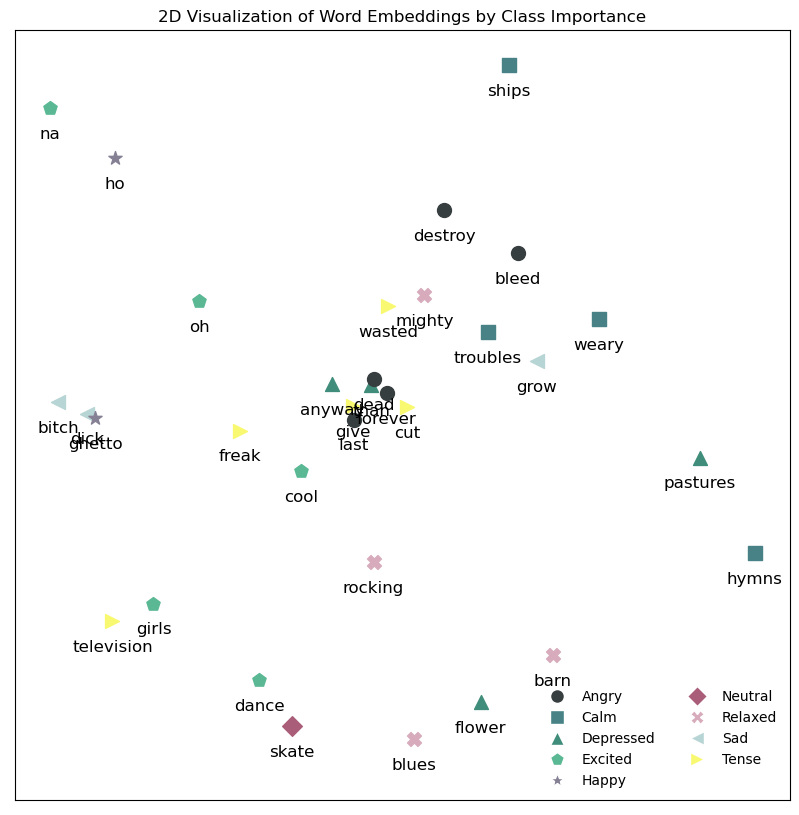

In [20]:
# plot_feature_importance(Icj_AVG, glove_embeddings, label_encoder, N=5)
# plot_feature_importance(Icj_LIME, glove_embeddings, label_encoder, N=5)
plot_feature_importance(Icj_H, glove_embeddings, emotion_label_encoder, N=5, repo_path='../images/emotion_global.png')

In [30]:
top_features_per_class = {
        emotion_label_encoder.inverse_transform([label])[0]: sorted(Icj_H[label].items(), key=lambda x: x[1], reverse=True)[:100]
        for label in Icj_H
    }

In [31]:
top_features_per_class

{'Angry': [('last', 0.6867315151563894),
  ('dead', 0.6430675201214336),
  ('forever', 0.585555792429194),
  ('destroy', 0.5490175845216929),
  ('bleed', 0.5466475383259694),
  ('end', 0.5421856436268045),
  ('scream', 0.5419835171509958),
  ('fucking', 0.5376279922509498),
  ('rotting', 0.5331502315199339),
  ('die', 0.5145082752233164),
  ('darkness', 0.4954582666509214),
  ('remains', 0.49181156145915744),
  ('destruction', 0.48839746668482237),
  ('noise', 0.4760895912036602),
  ('blood', 0.4704942554811095),
  ('closer', 0.46014469235085065),
  ('hate', 0.45730214995207036),
  ('consumed', 0.449795967248049),
  ('exist', 0.43621227501033827),
  ('torture', 0.42103014734822525),
  ('wool', 0.4118537387037942),
  ('deny', 0.39534142489345014),
  ('thorn', 0.3946510571873677),
  ('fail', 0.388851613302876),
  ('monster', 0.3881472874880927),
  ('souls', 0.3850526124673368),
  ('save', 0.3847802379056217),
  ('throne', 0.38472318404595557),
  ('ugly', 0.3830774948563993),
  ('wrath', 

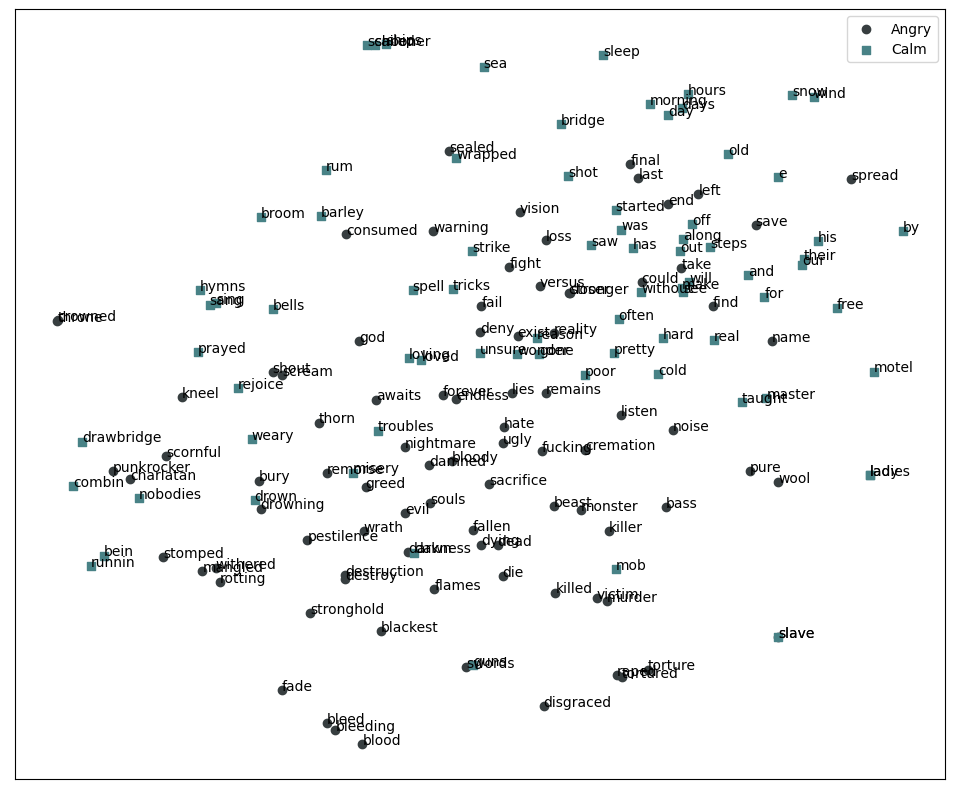

In [19]:
selected_classes = ['Angry', 'Calm']
plot_word_embeddings(top_features_per_class, glove_embeddings, selected_classes, emotion_label_encoder, repo_path='../images/emotion_tense_vs_angry.png')

In [17]:
def cluster_words_in_class(words_weights, glove_embeddings, n_clusters=5):
    words, weights = zip(*words_weights)
    embeddings = np.array([glove_embeddings[word] for word in words if word in glove_embeddings])
    weighted_embeddings = embeddings * np.sqrt(np.array(weights[:embeddings.shape[0]])[:, np.newaxis])

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(weighted_embeddings)
    labels = kmeans.labels_
    
    clusters = {i: [] for i in range(n_clusters)}
    for word, label in zip(words, labels):
        clusters[label].append(word)

    return clusters

In [19]:
for label, words_weights in top_features_per_class.items():
    print(f"Class: {label}")
    clusters = cluster_words_in_class(words_weights, glove_embeddings, n_clusters=5)
    for i, cluster in clusters.items():
        print(f"  Cluster {i+1}: {cluster}")

Class: Angry


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['slave', 'punkrocker', 'bury', 'nightmare', 'warning', 'killed', 'devouring', 'vermin', 'guilty']
  Cluster 2: ['wool', 'save', 'take', 'thorn', 'shout', 'use', 'Asphyxiation', 'drowning', 'died', 'fail', 'consumed', 'raped', 'Fallen', 'die', 'Murder', 'fall', 'deadly', 'cigarette', 'dragged', 'left', 'now', 'branded', 'Livid', 'forcing', 'salt', 'last', 'monstrous', 'cared', 'Bitten', 'blood']
  Cluster 3: ['Reign', 'never', 'hate', 'spread', 'bloody', 'deny', 'sacrifice', 'victim', 'mangled', 'ugly', 'bleeding', 'Hatred', 'face', 'Die', 'surrender', 'could', 'obsolete', 'anymore', 'decayed', 'war', 'history', 'torture']
  Cluster 4: ['forever', 'rotting', 'dead', 'fallen', 'versus', 'sealed', 'burn']
  Cluster 5: ['evil', 'destroy', 'fucking', 'cremation', 'resist', 'withered', 'screw', 'bass', 'Can', 'matter', 'disgraced', 'Nothing', 'remorse', 'swords', 'scream', 'fight', 'find', 'disrespect', 'This']
Class: Tense


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['hell']
  Cluster 2: ['Wwhhooooaaaaa', 'give', 'game', 'lame', 'bait', 'loser', 'Screaming', 'punch', 'kerosene', 'Time']
  Cluster 3: ['freak', 'mind', 'ride', 'believe', 'self', 'slip', 'You', 'excuses', 'empire', 'breaks', 'yesterday', 'youngin', 'Everything', 'discover', 'rip', 'entertainer', 'Superman', 'run']
  Cluster 4: ['babe', 'head', 'straight', 'new', 'rock', 'fregging', 'amuse', 'convince', 'Run', 'different', 'nostalgia', 'typical', 'draining', 'razor', 'lies', 'urge', 'crawl', 'types', 'the', 'Into', 'pulls', 'admit']
  Cluster 5: ['life', 'streets', 'television', 'smell', 'this', 'a', 'toke', 'just', 'shock', 'revenge', 'favorite', 'wasted', 'always', 'twist', 'well', 'common', 'regrets', 'reel', 'losers', 'Exaggerate', 'toy', 'twisted', 'solution', 'roll', 'Ahahahahahahahaha', 'regard', 'tripe', 'pissed', 'rollercoasters', 'biting', 'better', 'reignites', 'Africa', 'met', 'disarming', 'disguise', 'move']
Class: Excited


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['street', 'music', 'line', 'town', 'playing', 'profile', 'petticoats', 'improve', 'thrill', 'cause']
  Cluster 2: ['dance', 'girls', 'cool', 'joy', 'fun', 'bolshy', 'Infatuation', 'deeper']
  Cluster 3: ['A', 'approaching', 'style', 'need']
  Cluster 4: ['go', 'a', 'he', 'club', 'show', 'situation', 'sure', 'into', 'Where', 'trouble', 'wanna', 'watching', 'letters', 'attraction', 'craze', 'living', 'Love', 'shopping', 'date', 'look', 'thinking', 'had', 'Give', 'guaranteed', 'Tell', 'insecure', 'clue', 'to', 'captivated', 'feeling', 'subtle', 'satisfied', 'mall', 'em']
  Cluster 5: ['oh', 'huh', 'excited', 'reggae', 'rhythm', 'heat', 'the', '8', 'sweat', 'hips', 'rate', 'busy', 'on', 'total', '3', 'figured', 'dancin', 'party', 'count', 'nowhere', 'sexy', 'Going', 'Rollercoaster', 'five', 'corner', 'temperature', 'must', 'Joyce', 'friends', 'whoa', 'political']
Class: Calm


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['ships', 'weary']
  Cluster 2: ['old']
  Cluster 3: ['Bethlehem', 'has', 'For']
  Cluster 4: ['hymns', 'sing', 'Take', 'Down', 'shot', 'bells', 'rejoice', 'misery', 'schooner', 'nobodies', 'Old', 'Peggy', 'often', 'Lovers', 'barley', 'combin', 'Lord', 'e', 'pretty', 'without', 'strike', 'drown', 'runnin', 'gone', 'dawn', 'started', 'cold', 'see', 'will', 'make', 'Qui', 'unsure', 'Yeah', 'was', 'day']
  Cluster 5: ['Just', 'bein', 'sailed', 'Singing', 'Josephine', 'snow', 'Freedom', 'Noontime', 'his', 'Rider', 'mob', 'ladies', 'Destroying', 'our', 'Mighty', 'by', 'wind', 'Heeeey', 'poor', 'lady', 'reason', 'morning', 'saw', 'Everybody', 'loving', 'away', 'along', 'sleep', 'not', 'free', 'her', 'out', 'Come']
Class: Neutral


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['Ooo', 'Drivin', 'Ohhhh', 'watchin', 'fortunate', 'motioned', 'sun', 'done', 'seems', 'turns']
  Cluster 2: ['misty']
  Cluster 3: ['luck', 'Mhm', 'river']
  Cluster 4: ['skate']
  Cluster 5: ['Mmm', 'horses', 'Tampa', 'foolish', 'luckiest', 'land', 'Running', 'warm', 'feet', 'anyone', 'ocean', 'curb', 'teach', 'selfish', 'But', 'should', 'comes', 'whole', 'stomach', 'need', 'garden', 'sad', 'desperate', 'She', 'devil', 'lose', 'an', 'world', 'useless', 'night', 'her', 'yeah', 'I', 'Christmas', 'man']
Class: Relaxed


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['no', 't', 'your', 'baby']
  Cluster 2: ['begging']
  Cluster 3: ['cried']
  Cluster 4: ['Wipe']
  Cluster 5: ['Don']
Class: Sad


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['rest', 'still', 'peacefully', 'wish', 'blunt', 'outside', 'Slowing', 'overcomplicate', 'nice', 'clay', 'split', 'Speeding', 'Don', 'strange', 'churches', 'across', 'pray', 'Because', 'Drink', 'strings', 'birthday', 'familiar', 'light', 'uncertainty', 'take', 'ring', 'outer', 'drunk', 'frame', 'let', 'whoa']
  Cluster 2: ['shit', 'nigga', 'a', 'found', 'emptiness', 'peace']
  Cluster 3: ['interrupted', 'smoke']
  Cluster 4: ['funny', 'lay', 'fix', 'Holding', 'Trust', 'wait', 'always', 'hypnotised', 'Float', 'wrote', 'stopped', 'Either', 'inside', 'holy', 'temptations', 'Turn', 'float']
  Cluster 5: ['asked', 'grow', 'Sing', 'far', 'God', 'loved', 'Without', 'businessman', 'Lady', 'yourself', 'heartbeat', 'bars', 'itself', 'Used', 'silence', 'comprehend', 'Street', 'silent', 'afraid', 'stupid', 'puppies', 'banging', 'bulletproof', 'carry', 'fuck', 'sense']
Class: Depressed


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['disappeared', 'tears', 'perversity', 'money']
  Cluster 2: ['than', 'anyway', 'sang', 'Loving', 'wonders', 'someday', 'much', 'bell', 'skin', 'sin', 'strangers', 'bit', 'soldier', 'sage', 'regret', 'wanted', 'leave', 'clarion', 'leaves', 'friend', 'cure', 'suicide', 'big', 'dawn', 'sinking', 'blame', 'these', 'told', 'Oh', 'have', 'cry', 'cup', 'morning', 'people', 'she', 'little', 'really', 'future', 'us', 'might']
  Cluster 3: ['Does', 'swam', 'pass', 'positive', 'circumstance', 'ash', 'waded', 'estate', 'poems', 'At', 'let', 'okay', 'rising', 'Shes', 'lib', 'bereaver', 'burning', 'animal', 'doctors', 'book', 'arsistance', 'danger', 'past', 'kept', 'fear', 'sun', 'men', 'moon', 'sleep', 'Tell', 'tonight', 'here', 'that', 'around', 'got', 'say', 'ever']
  Cluster 4: ['waitin']
  Cluster 5: ['anybody', 'gothic', 'carryon', 'Yet', 'Parsley', 'Repeat', 'where']
Class: Happy


C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\OWNER\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


  Cluster 1: ['feelin']
  Cluster 2: ['testify', 'anything', 'Listen', 'diamonds', 'Gonna', 'tried', 'fact', 'ry', 'understood', 'precious', 'hunnie', 'diamond', 'sweet', 'gonna', 'Square', 'gotta', 'things', 'along', 'chosen', 'is', 'can', 'What', 'to', 'on', 'day', 'got', 'get', 'do', 'come', 'like', 'your', 'for']
  Cluster 3: ['smilin']
  Cluster 4: ['Gods']
  Cluster 5: ['Kind', 'substance']


## Lyrics Genre (m4a)

In [21]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('genre_feature_weights_640.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('genre_feature_counts_640.pkl', 'rb') as f:
    feature_counts = pickle.load(f)
    
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

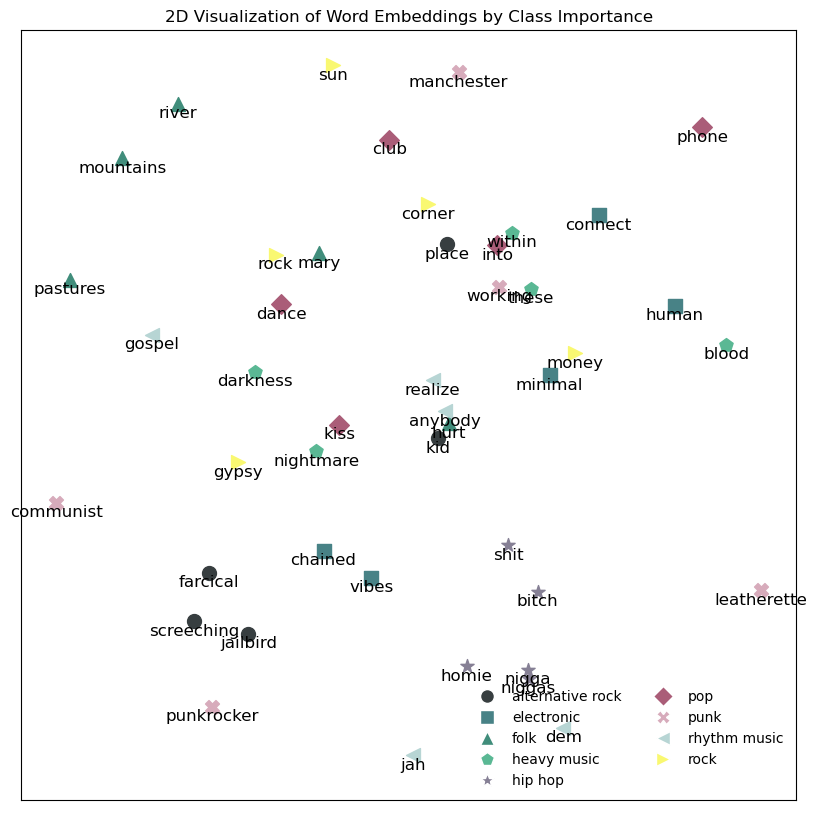

In [22]:
# plot_feature_importance(Icj_AVG, glove_embeddings, genre_label_encoder, N=5)
plot_feature_importance(Icj_H, glove_embeddings, genre_label_encoder, N=5, repo_path='../images/genre_global_calss_importance.png')

In [48]:
Icj_H

{0: {'might': 0.09006813006602554,
  'Blasts': 0.2295781175192974,
  'bombers': 0.2282010840613674,
  'glidepath': 0.218842112357664,
  'ready': 0.1437124520975596,
  'fail': 0.388851613302876,
  'die': 0.5145082752233164,
  'burn': 0.2557103887479465,
  'Hitler': 0.18988012997080664,
  'They': 0.057938942695322085,
  'destroy': 0.5490175845216929,
  'Reign': 0.36833568225936997,
  'disrespect': 0.27934309416812764,
  'me': 0.01815866720637163,
  'name': 0.33361683264279285,
  'face': 0.18728922589345917,
  'could': 0.3058325178952796,
  'and': 0.05322709421031937,
  'Strike': 0.18644249696149282,
  'This': 0.2785721314445249,
  'waste': 0.24221315536881233,
  'moon': 0.07404808030031108,
  'dancing': 0.10071472093077476,
  'human': 0.19300923217758148,
  'no': 0.13358004621249164,
  'a': 0.10743997137057537,
  'now': 0.24296713417748336,
  'that': 0.03656635127773633,
  'night': 0.076485984138374,
  'at': 0.19735795390394684,
  't': 0.2400763192343219,
  'I': 0.1013912371116291,
  'fo

In [27]:
top_features_per_class = {
        genre_label_encoder.inverse_transform([label])[0]: sorted(Icj_H[label].items(), key=lambda x: x[1], reverse=True)[:50]
        for label in Icj_H
    }

top_features_per_class

{'heavy music': [('darkness', 0.9570506953734073),
  ('nightmare', 0.8090902702515674),
  ('these', 0.7421737344249172),
  ('blood', 0.7219381294600011),
  ('within', 0.672890023449257),
  ('wake', 0.6246819687190137),
  ('dead', 0.6192043675989962),
  ('wrath', 0.6011570346208785),
  ('evil', 0.5938986762792398),
  ('fucking', 0.5925700587390027),
  ('grave', 0.5829600453305114),
  ('destruction', 0.5814787007929622),
  ('souls', 0.5355381133767028),
  ('fears', 0.5323792147004021),
  ('burning', 0.5145573604894413),
  ('cursed', 0.5074263054193854),
  ('death', 0.49833826780838514),
  ('misery', 0.4980835339567248),
  ('crowned', 0.49747060692619033),
  ('grief', 0.4972220809367068),
  ('metal', 0.49537728778174517),
  ('final', 0.49296247409545585),
  ('thorn', 0.4909055929036465),
  ('unrelenting', 0.48841351197798294),
  ('salvation', 0.4868315044963491),
  ('despair', 0.4850621348178954),
  ('path', 0.47948435532605205),
  ('fallen', 0.4793771182983555),
  ('regrets', 0.478791826

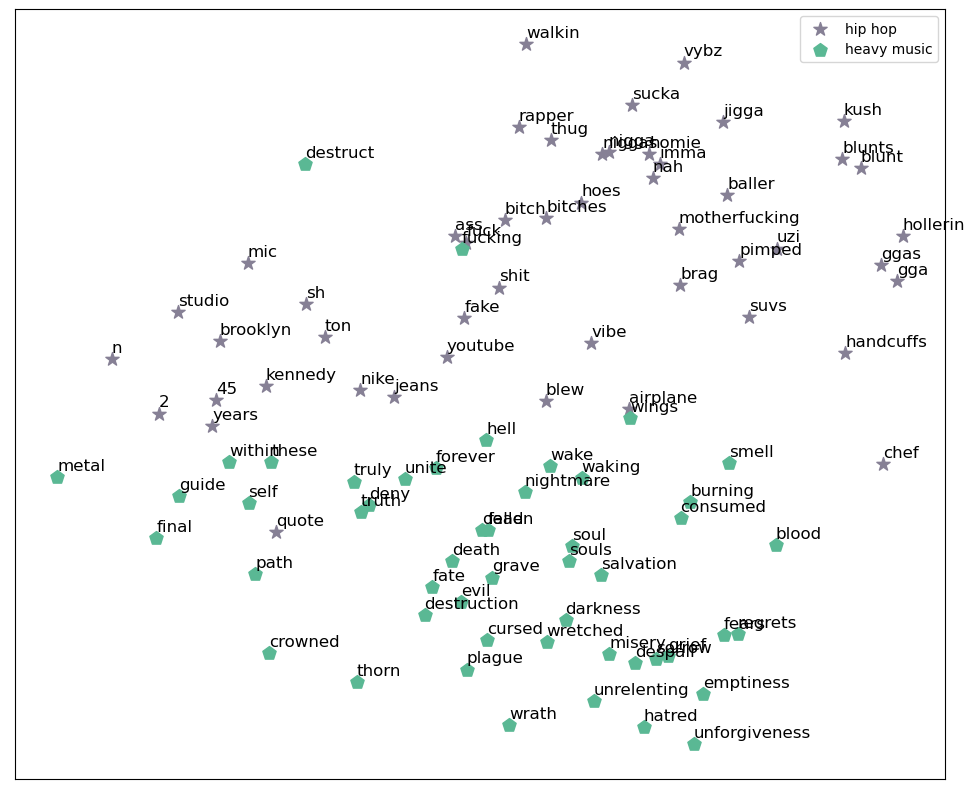

In [30]:
selected_classes = ['hip hop', 'heavy music']
plot_word_embeddings(top_features_per_class, glove_embeddings, selected_classes, genre_label_encoder, repo_path='../images/genre_hiphop_vs_heavy.png')

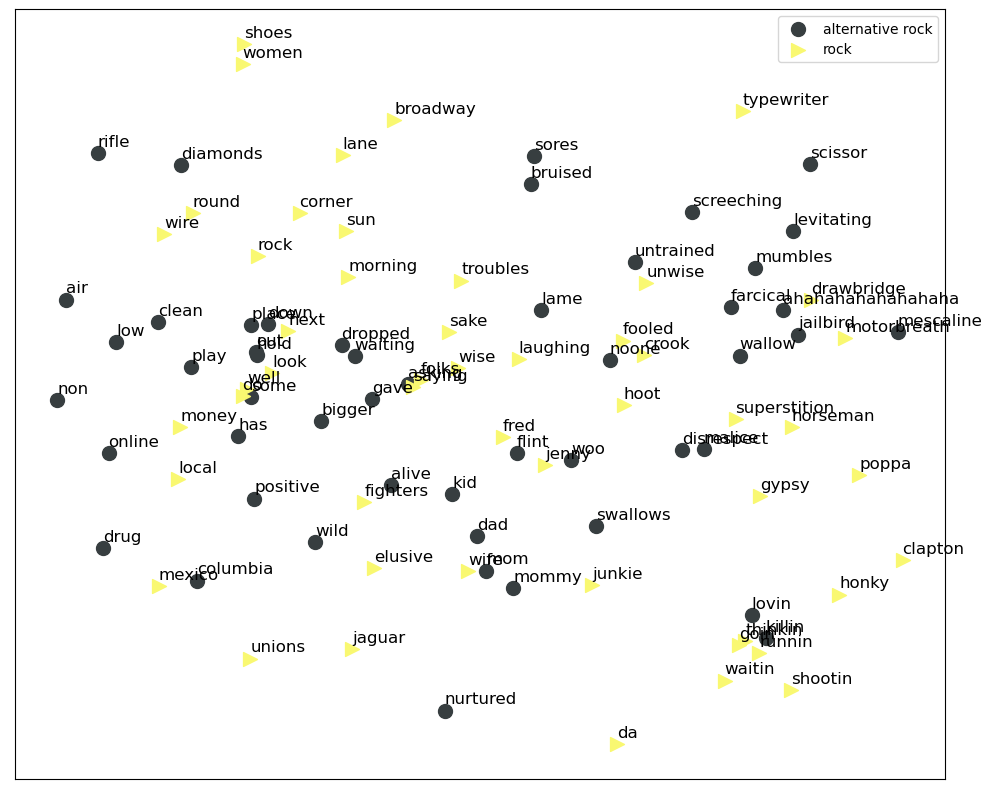

In [31]:
selected_classes = ['alternative rock', 'rock']
plot_word_embeddings(top_features_per_class, glove_embeddings, selected_classes, genre_label_encoder,  repo_path='../images/genre_altrock_vs_rock.png')

## Audio Emotion (m4a)

In [6]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('emotion_audio_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('emotion_audio_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)
    
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [7]:
top_features_per_class = {
        emotion_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_AVG
    }

top_features_per_class

{'Happy': [('drums0', 0.06569220674366015),
  ('drums9', 0.05268124034198241),
  ('drums1', 0.052639931879685846),
  ('other9', 0.044841753043088246),
  ('vocals2', 0.04052276789895163),
  ('drums2', 0.03466105507829651),
  ('other8', 0.03277885952144949),
  ('drums8', 0.030532332294775946),
  ('drums5', 0.030208808140996937),
  ('drums3', 0.030161622331495188),
  ('drums7', 0.028653320387165605),
  ('other2', 0.027263419723785598),
  ('drums6', 0.02648144098403292),
  ('other0', 0.025716269073425384),
  ('vocals7', 0.0250860499367442),
  ('vocals1', 0.023534450234412474),
  ('vocals8', 0.023476421995289064),
  ('vocals9', 0.021690474004188467),
  ('drums4', 0.021230142746324423),
  ('other5', 0.020370986462632745),
  ('vocals6', 0.01894968798761525),
  ('vocals4', 0.018048038502388803),
  ('vocals0', 0.015977155476930353),
  ('other1', 0.015950677741107783),
  ('other7', 0.015856132761509774),
  ('bass0', 0.014810761861503319),
  ('vocals3', 0.013418028208460497),
  ('other6', 0.01308

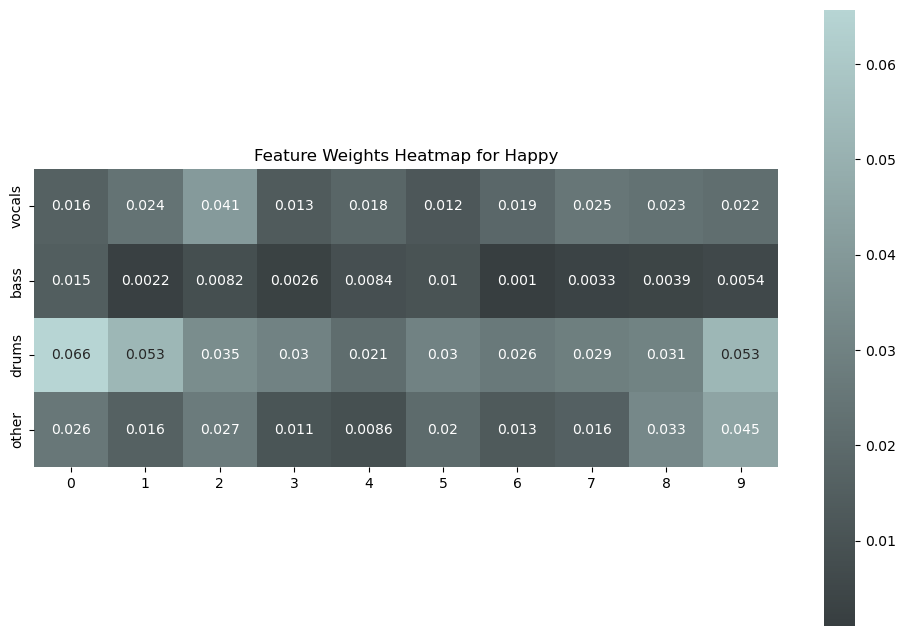

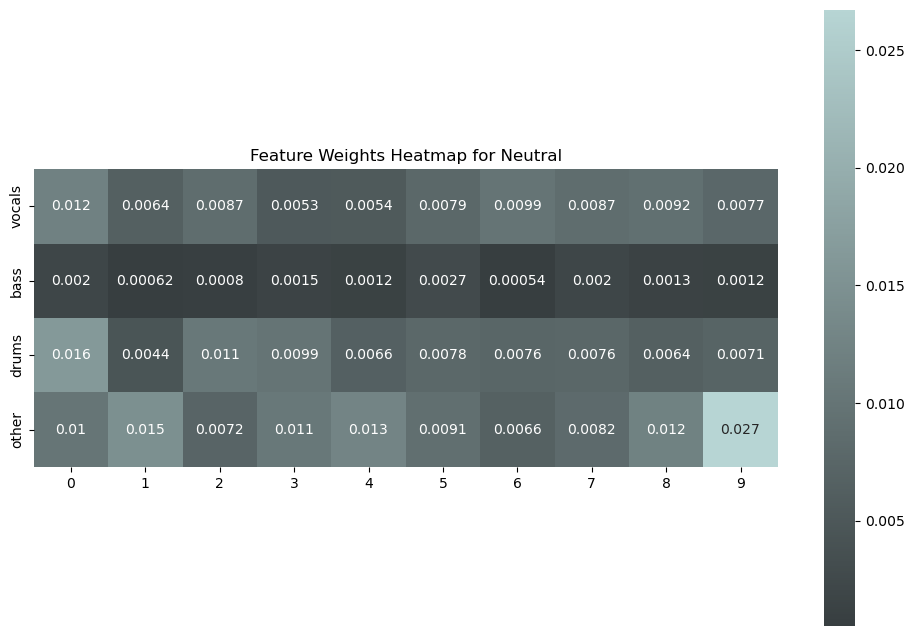

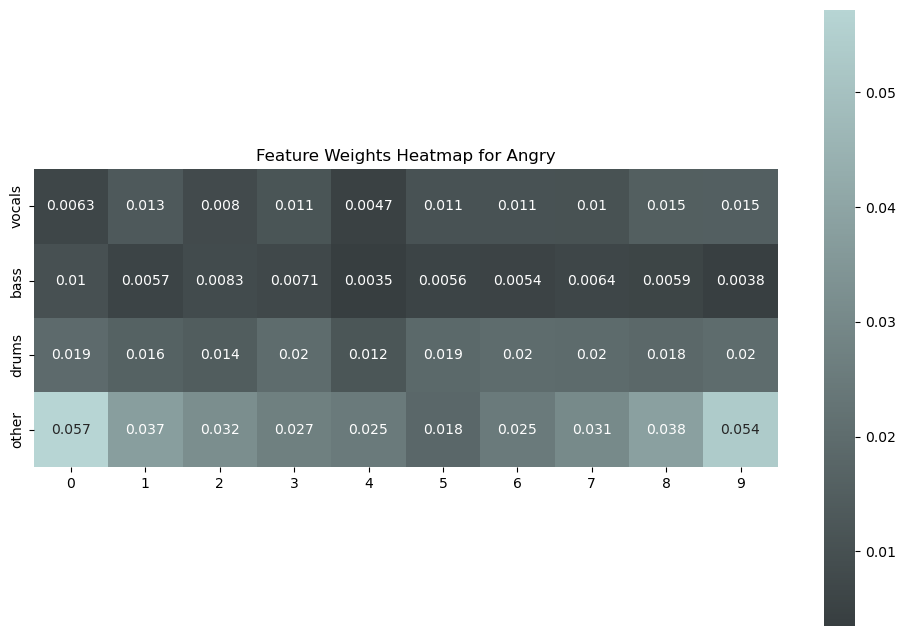

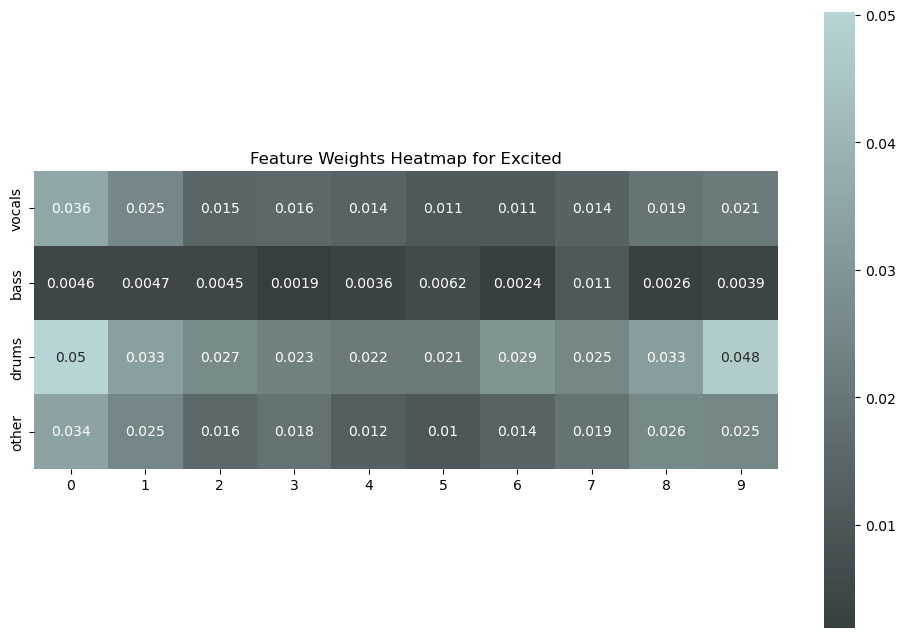

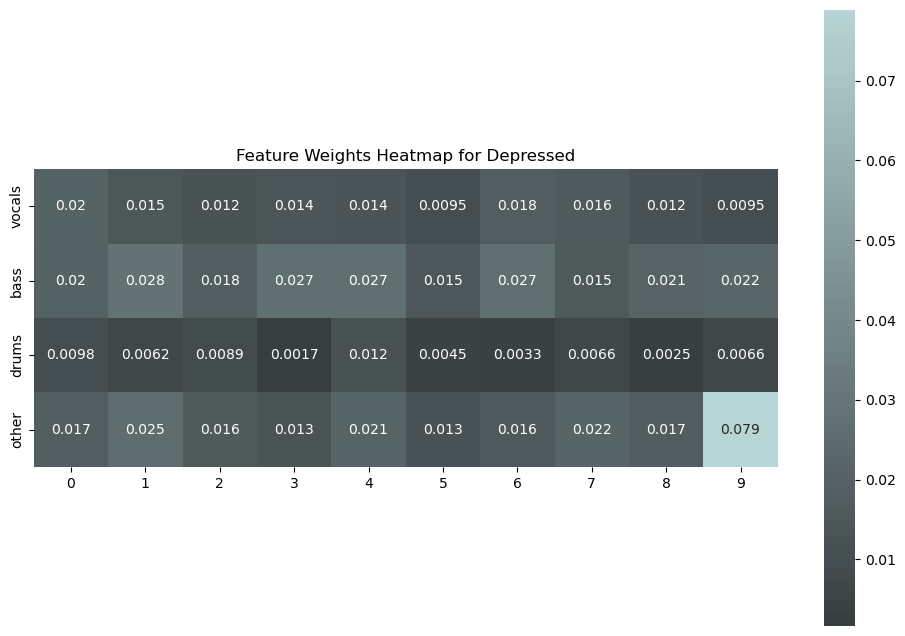

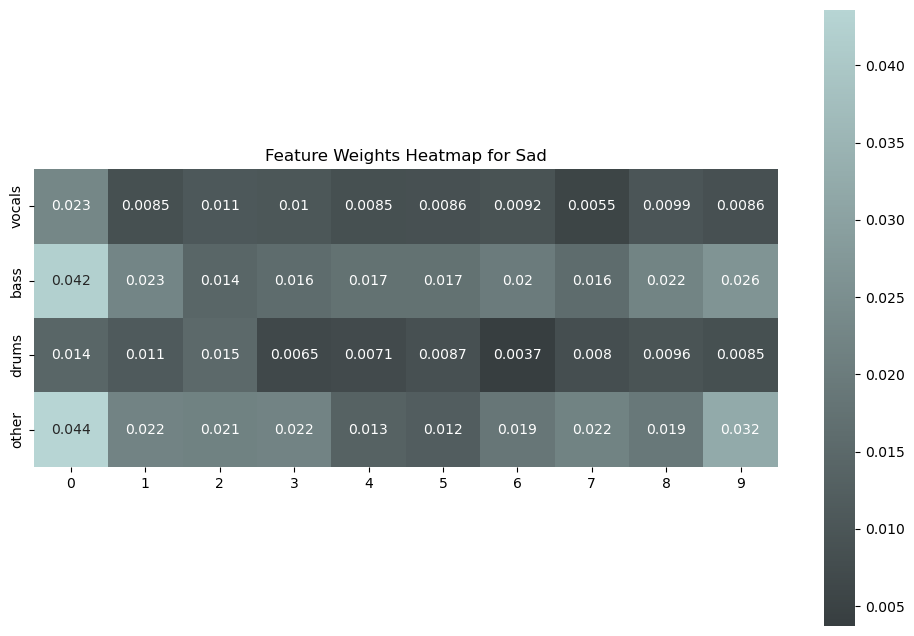

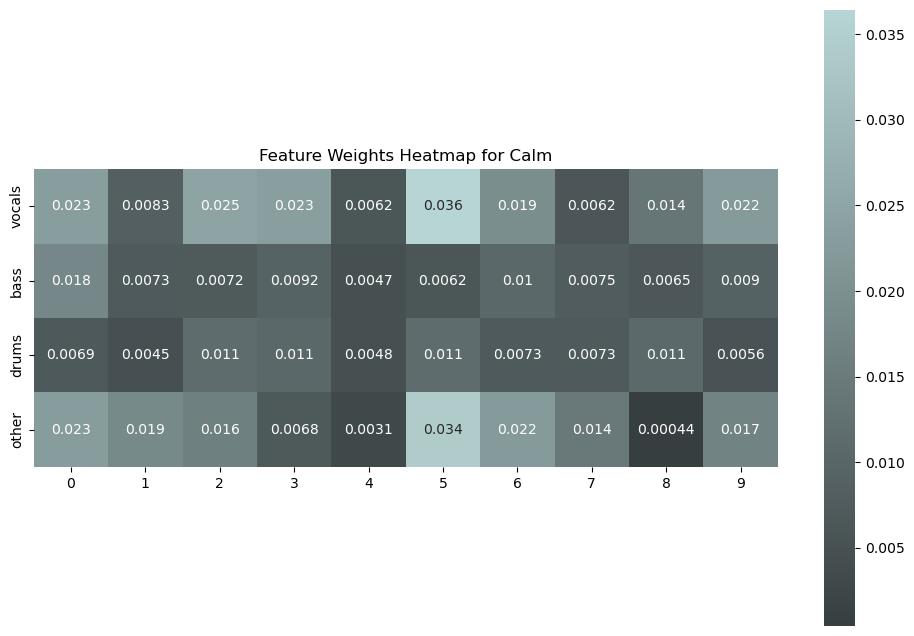

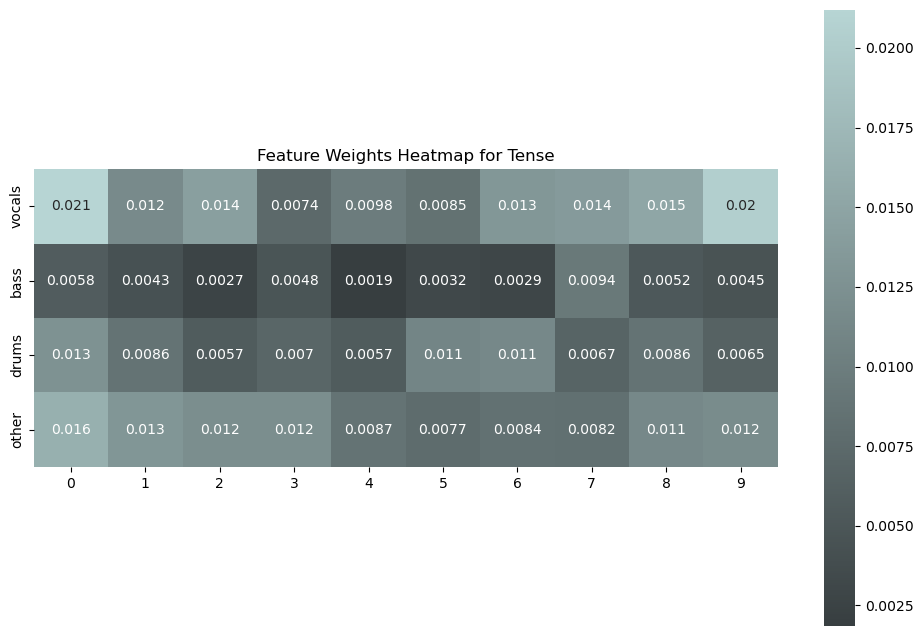

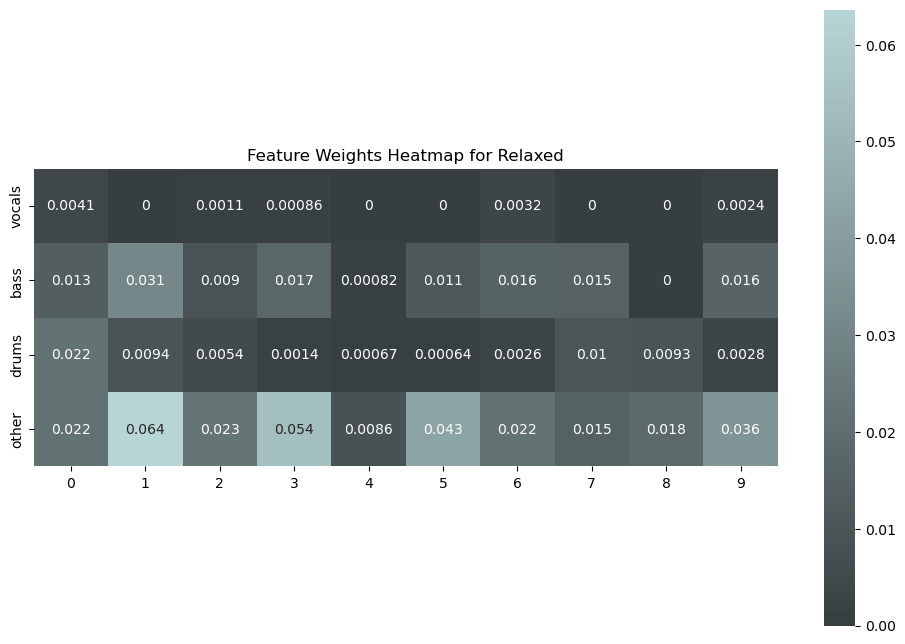

In [8]:
features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
            'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
            'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
            'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9'
           ]

categories = {
    'vocals': ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 
               'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9'],
    'bass': ['bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 
             'bass6', 'bass7', 'bass8', 'bass9'],
    'drums': ['drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 
              'drums6', 'drums7', 'drums8', 'drums9'],
    'other': ['other0', 'other1', 'other2', 'other3', 'other4', 'other5', 
              'other6', 'other7', 'other8', 'other9']
}

weight_matrix = {cls: {cat: [0]*len(features) for cat, features in categories.items()} for cls in top_features_per_class}
colors = ["#373E40", "#B7D5D4"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

for cls, feats in top_features_per_class.items():
    for feature, weight in feats:
        for cat, features in categories.items():
            if feature in features:
                weight_matrix[cls][cat][features.index(feature)] = weight

for cls, cat_weights in weight_matrix.items():
    plt.figure(figsize=(12, 8))
    
    heatmap_data = []
    yticklabels = []
    for cat, weights in cat_weights.items():
        heatmap_data.append(weights)
        yticklabels.append(cat)
    
    heatmap_data = np.array(heatmap_data)
    
    # xticklabels = [feature for cat in categories.values() for feature in cat]
    
    sns.heatmap(heatmap_data, annot=True, cmap=cmap, yticklabels=yticklabels, square=True)
    plt.title(f'Feature Weights Heatmap for {cls}')
    # plt.yticks(rotation=90)
    # plt.savefig(f'../images/XAI/audio_global_heatmap_{cls}_AVG.png', bbox_inches='tight')
    plt.show()

## Audio Genre (m4a)

In [6]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('audio_genre_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('audio_genre_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)
    
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [12]:
top_features_per_class = {
        genre_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_AVG
    }

top_features_per_class

{'pop': [('vocals0', 0.07341926549292604),
  ('vocals6', 0.06745888533391964),
  ('vocals5', 0.06533862787474468),
  ('vocals4', 0.06418172848416684),
  ('vocals9', 0.06103731211902907),
  ('vocals2', 0.05794425294471061),
  ('vocals8', 0.056117000157594826),
  ('vocals1', 0.05537926500210591),
  ('vocals3', 0.05077069266832982),
  ('vocals7', 0.04418814806253101),
  ('other0', 0.039734263535457844),
  ('drums0', 0.03765131427050538),
  ('other2', 0.034184503341702),
  ('other6', 0.033719972002497406),
  ('other9', 0.030471888014444743),
  ('other3', 0.029966789872569705),
  ('other8', 0.02949790457367419),
  ('other1', 0.02886838841076444),
  ('drums9', 0.027606161854650285),
  ('other5', 0.02725924531804777),
  ('other7', 0.02669110202986456),
  ('other4', 0.026387420453925458),
  ('drums7', 0.02408205397588787),
  ('drums6', 0.023602348638889145),
  ('drums1', 0.023034873669904733),
  ('drums3', 0.023029596020048063),
  ('drums2', 0.022989680974907906),
  ('drums5', 0.02297497189904

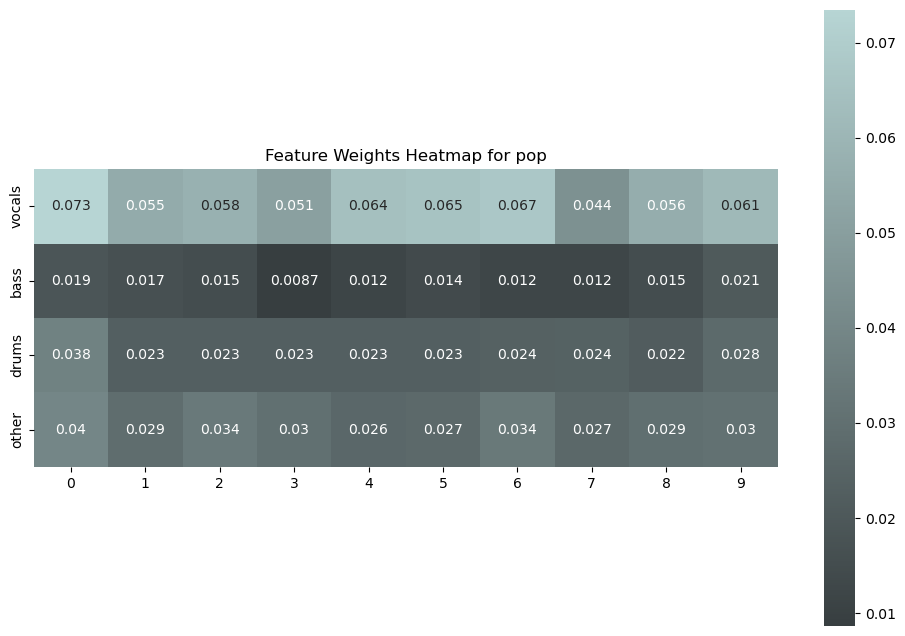

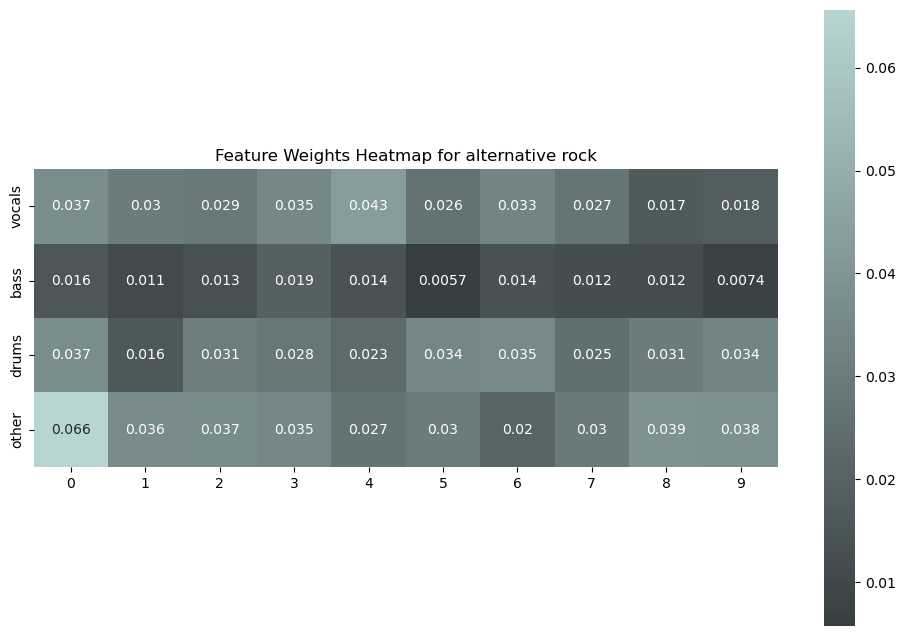

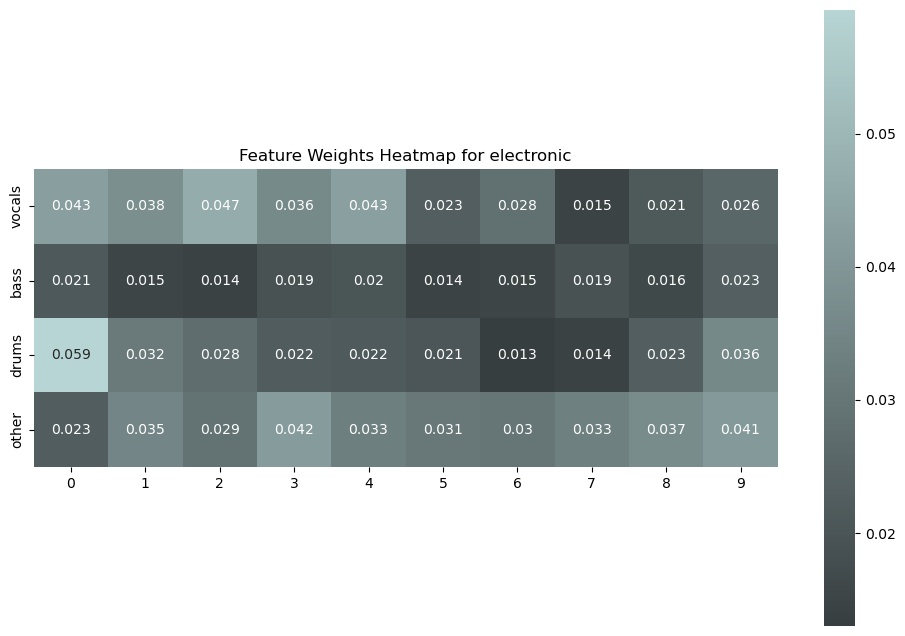

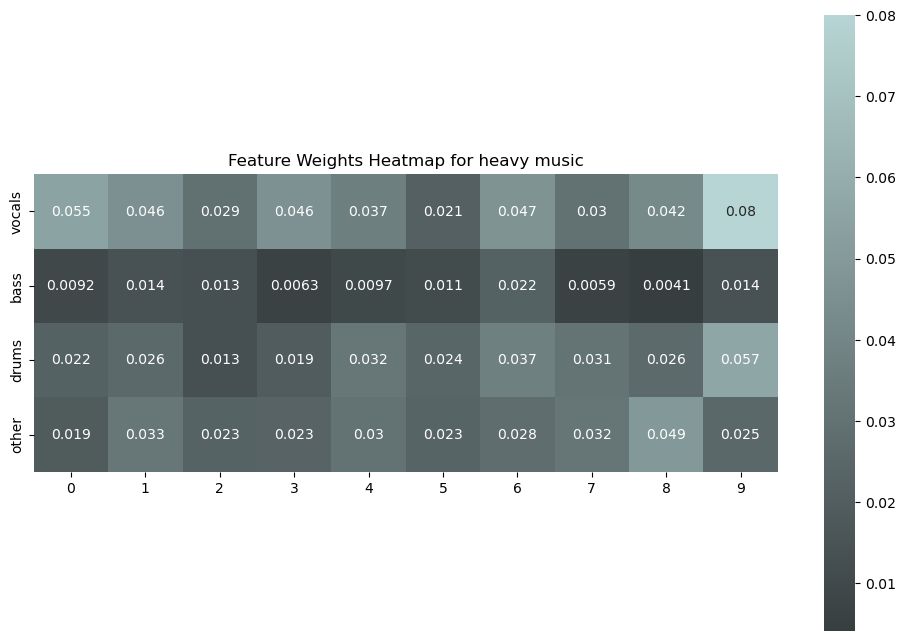

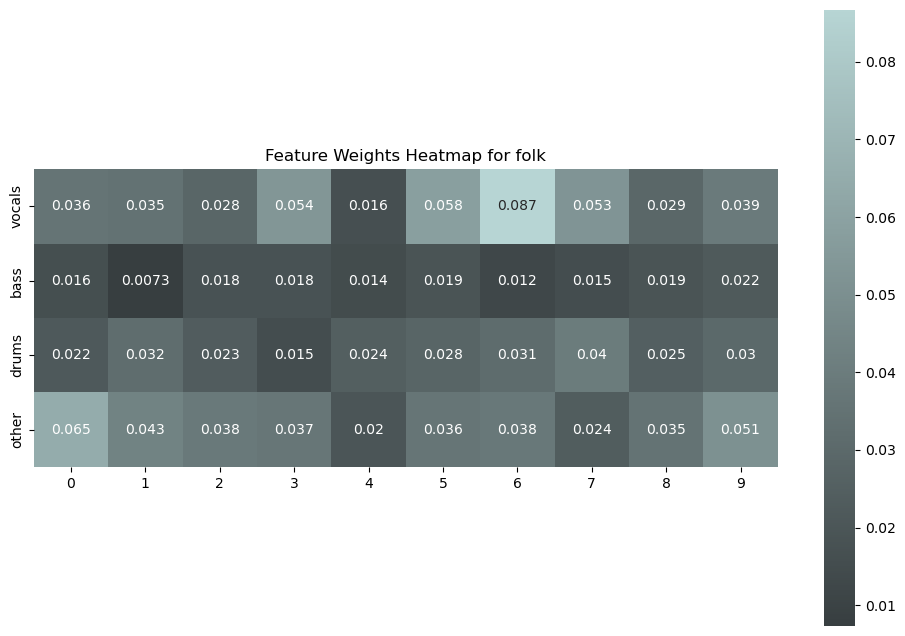

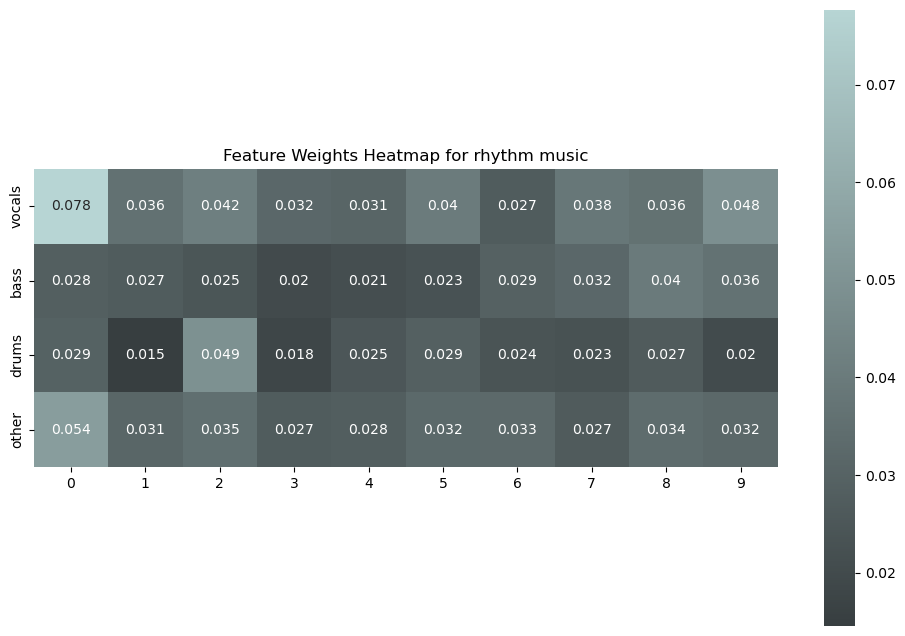

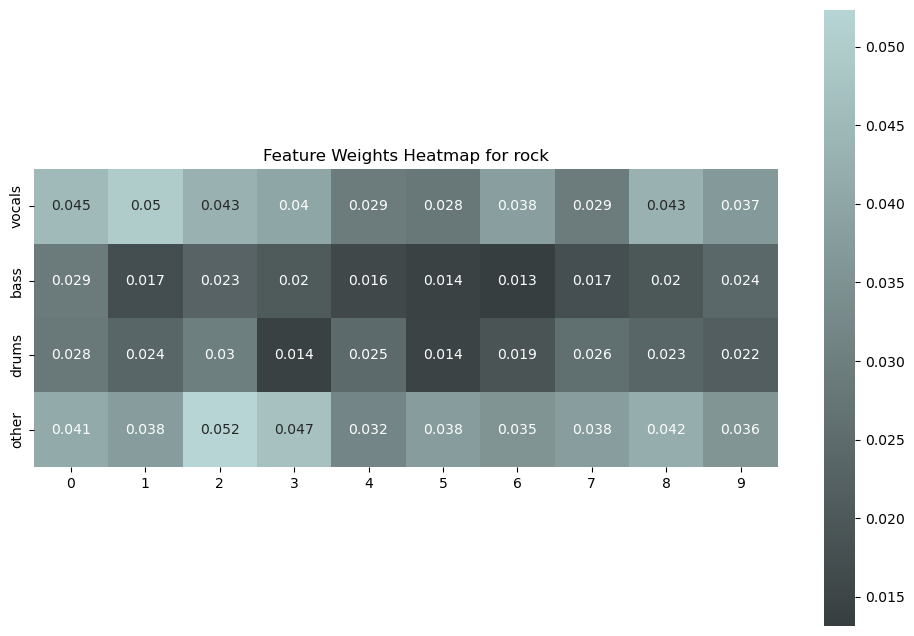

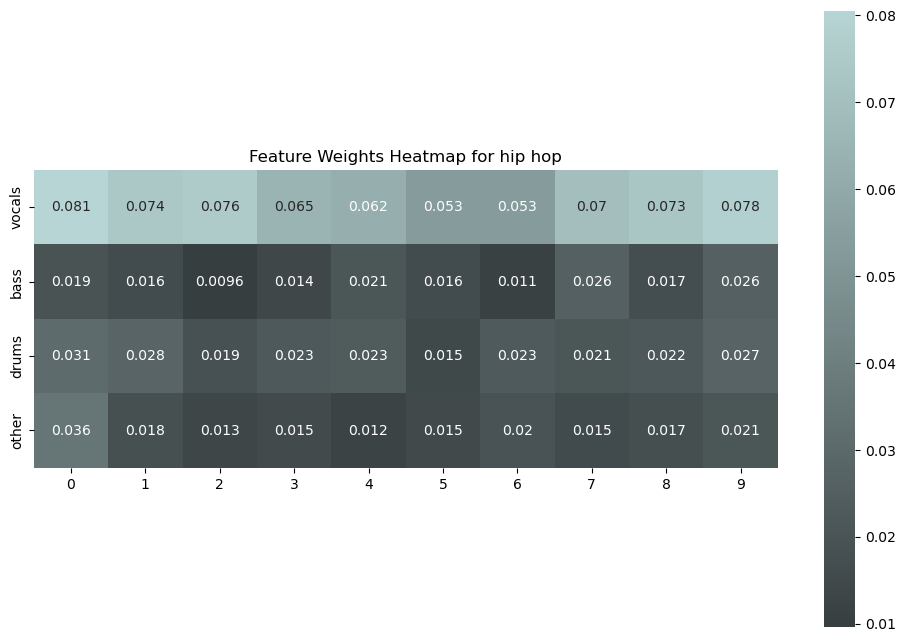

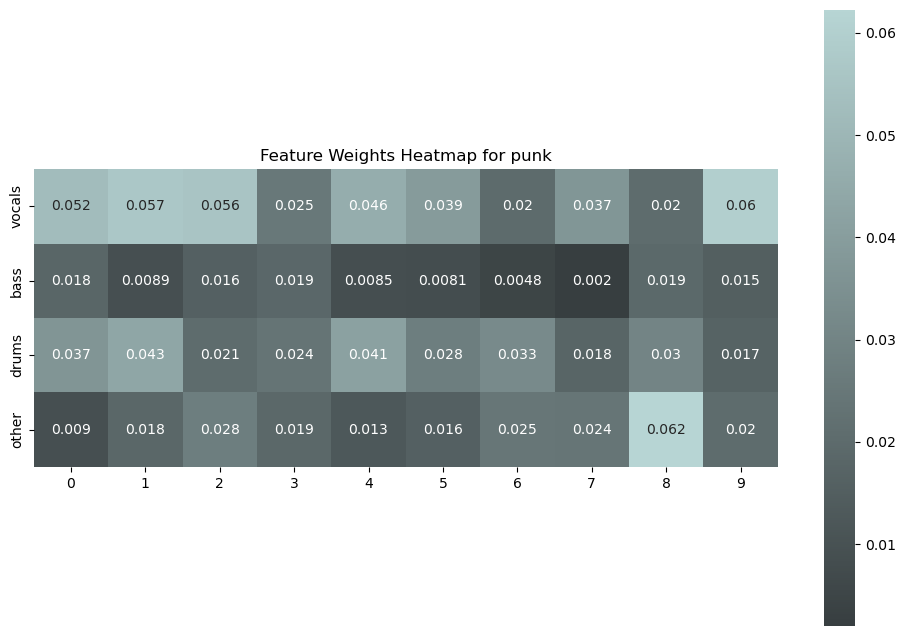

In [13]:
features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
            'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
            'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
            'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9'
           ]

categories = {
    'vocals': ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 
               'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9'],
    'bass': ['bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 
             'bass6', 'bass7', 'bass8', 'bass9'],
    'drums': ['drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 
              'drums6', 'drums7', 'drums8', 'drums9'],
    'other': ['other0', 'other1', 'other2', 'other3', 'other4', 'other5', 
              'other6', 'other7', 'other8', 'other9']
}

weight_matrix = {cls: {cat: [0]*len(features) for cat, features in categories.items()} for cls in top_features_per_class}
colors = ["#373E40", "#B7D5D4"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

for cls, feats in top_features_per_class.items():
    for feature, weight in feats:
        for cat, features in categories.items():
            if feature in features:
                weight_matrix[cls][cat][features.index(feature)] = weight

for cls, cat_weights in weight_matrix.items():
    plt.figure(figsize=(12, 8))
    
    heatmap_data = []
    yticklabels = []
    for cat, weights in cat_weights.items():
        heatmap_data.append(weights)
        yticklabels.append(cat)
    
    heatmap_data = np.array(heatmap_data)
    
    # xticklabels = [feature for cat in categories.values() for feature in cat]
    
    sns.heatmap(heatmap_data, annot=True, cmap=cmap, yticklabels=yticklabels, square=True)
    plt.title(f'Feature Weights Heatmap for {cls}')
    # plt.yticks(rotation=90)
#     plt.savefig(f'../images/XAI/audio_global_heatmap_{cls}_AVG.png', bbox_inches='tight')
    plt.show()

In [19]:
weight_matrix

{'pop': {'vocals': [0.6029826015223707,
   0.21879068475198318,
   0.5499734581863333,
   0.33716599274547887,
   0.8735866039769347,
   0.7939293171985933,
   0.6357631360627765,
   0.2910070412671102,
   1.1726684999688648,
   0.8106245738363966],
  'bass': [0.4369998649826963,
   0.2569681796022871,
   0.48930297424216435,
   0.18706429344498082,
   0.2261186754609369,
   0.24429489870308066,
   0.2553417560578456,
   0.6207024857491307,
   0.5643894891489152,
   0.4480440403324526],
  'drums': [0.4323979577928707,
   0.1100961556258607,
   0.10822428721027982,
   0.09504767451127775,
   0.0,
   0.12164564232917265,
   0.10682020591309915,
   0.2457716463540297,
   0.061959734973028265,
   0.6551506522164441],
  'other': [1.1371783647638183,
   0.2861219764420272,
   0.7378725252920935,
   0.47384657475541464,
   0.46737499907563984,
   0.44729829857770476,
   0.40954264944283886,
   0.4328298194309231,
   0.3405887873757659,
   0.8196413497261816]},
 'alternative rock': {'vocals': 

## Multimodal Genre (m4a)

In [41]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('genre_multimodal_feature_weights_5000.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('genre_multimodal_feature_counts_5000.pkl', 'rb') as f:
    feature_counts = pickle.load(f)

feature_weights = merge_features_by_class(feature_weights)
feature_counts = merge_features_by_class(feature_counts)

In [42]:
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [43]:
top_features_per_class = {
        genre_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_AVG
    }

top_features_per_class

{'alternative rock': [('destruct', 0.0570419018835881),
  ('freakin', 0.05622367713219039),
  ('yeah', 0.036820496222052614),
  ('high', 0.03414387868952368),
  ('copulate', 0.03294260932337293),
  ('vocals0', 0.03218483149343093),
  ('split', 0.029723325529951317),
  ('other4', 0.026397711332518062),
  ('other0', 0.02607192571885199),
  ('other9', 0.024261256923677334),
  ('up', 0.024078124738337182),
  ('bass0', 0.024022612179287955),
  ('other8', 0.023758754430042005),
  ('vocals8', 0.02247950281634849),
  ('other1', 0.02192769867106132),
  ('grow', 0.021625005534056302),
  ('maggots', 0.020586874050484427),
  ('other5', 0.020481302549281856),
  ('vocals6', 0.020345081704053573),
  ('laugh', 0.020016610135732926),
  ('baby', 0.01939204805016826),
  ('other7', 0.019269142690966783),
  ('because', 0.0181432333380232),
  ('kinda', 0.017934081483329794),
  ('ocean', 0.01786465822525775),
  ('cracked', 0.01781320196876171),
  ('video', 0.017622156817740726),
  ('accounts', 0.017448367836

In [44]:
punk_features = top_features_per_class.get('punk', [])[:10]
punk_labels = [feature for feature, weight in punk_features]
punk_weights = [weight for feature, weight in punk_features]

hiphop_features = top_features_per_class.get('hip hop', [])[:10]
hiphop_labels = [feature for feature, weight in hiphop_features]
hiphop_weights = [weight for feature, weight in hiphop_features]

In [21]:
hiphop_labels[0] = 'n-word'
hiphop_labels[1] = '[SLUR]'
hiphop_labels

['n-word',
 '[SLUR]',
 'hood',
 'fucking',
 'homie',
 'shit',
 'bitch',
 'vocals9',
 'drums9',
 'suicide']

C:\Users\OWNER\AppData\Local\Temp\ipykernel_21064\2574386529.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0].set_yticklabels(hiphop_labels, fontsize=16)
C:\Users\OWNER\AppData\Local\Temp\ipykernel_21064\2574386529.py:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1].set_yticklabels(punk_labels, fontsize=16)


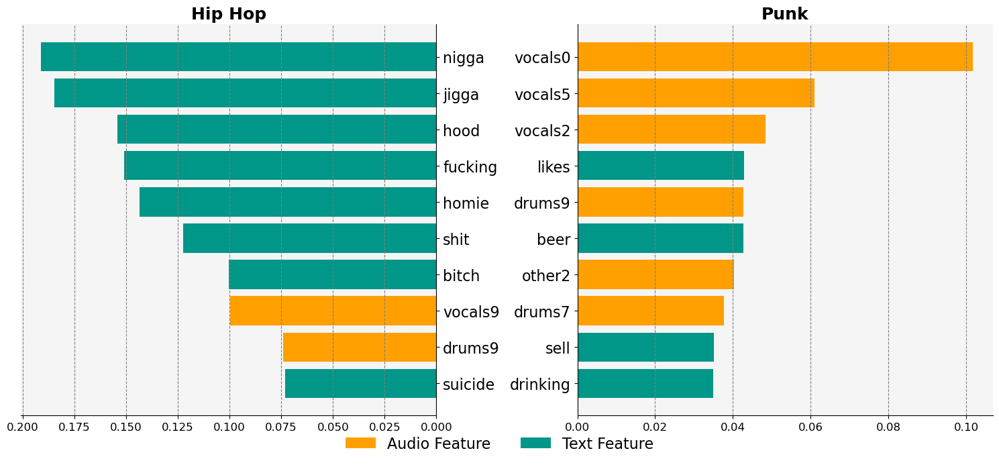

In [45]:
special_features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
                    'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
                    'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
                    'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9']

default_color = '#009688'
special_color = '#FFA000'

def assign_colors(features_list):
    return [special_color if feature in special_features else default_color for feature in features_list]

punk_colors = assign_colors(punk_labels)
hiphop_colors = assign_colors(hiphop_labels)

fig, axes = plt.subplots(1, 2, figsize=(15, 7), sharey=False)

axes[0].barh(hiphop_labels, hiphop_weights, color=hiphop_colors)
axes[0].set_title('Hip Hop', fontsize=18, fontweight='bold')
axes[0].invert_yaxis()
axes[0].invert_xaxis()
axes[0].yaxis.set_label_position('right')
axes[0].yaxis.tick_right()

axes[0].set_yticklabels(hiphop_labels, fontsize=16)

axes[0].spines['top'].set_visible(False)
axes[0].spines['left'].set_visible(False)

axes[0].grid(True, which='major', axis='x', linestyle='--', color='gray')

axes[1].barh(punk_labels, punk_weights, color=punk_colors)
axes[1].set_title('Punk', fontsize=18, fontweight='bold')
axes[1].invert_yaxis()

axes[1].set_yticklabels(punk_labels, fontsize=16)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

axes[1].grid(True, which='major', axis='x', linestyle='--', color='gray')

for ax in axes:
    ax.tick_params(axis='x', which='major', labelsize=12)  # Keep x-axis label size the same
    ax.set_facecolor('#F5F5F5')

legend_elements = [Patch(facecolor=special_color, label='Audio Feature'),
                   Patch(facecolor=default_color, label='Text Feature')]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, fontsize=16, frameon=False)

plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.savefig(r'D:\Diploma Thesis\images\XAI\hiphop_punk_top10.png', format='png', bbox_inches='tight', dpi=400)
plt.show()

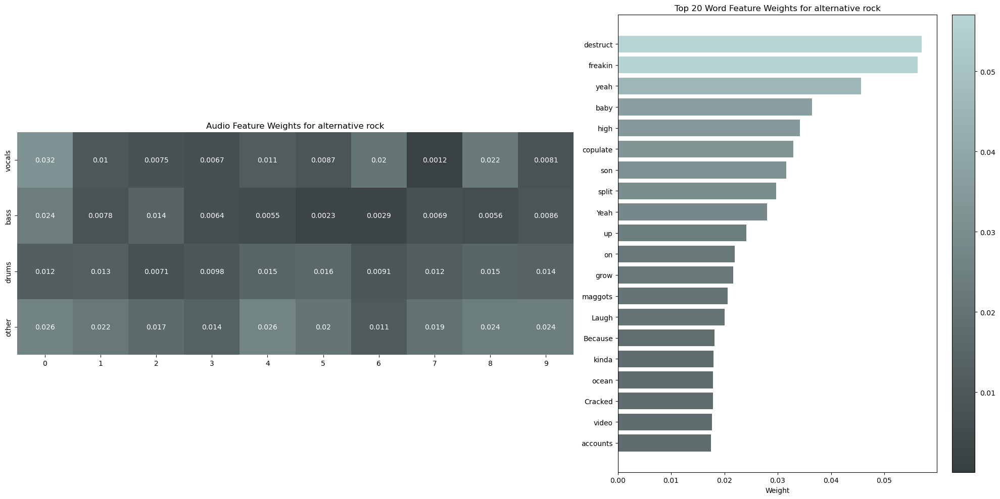

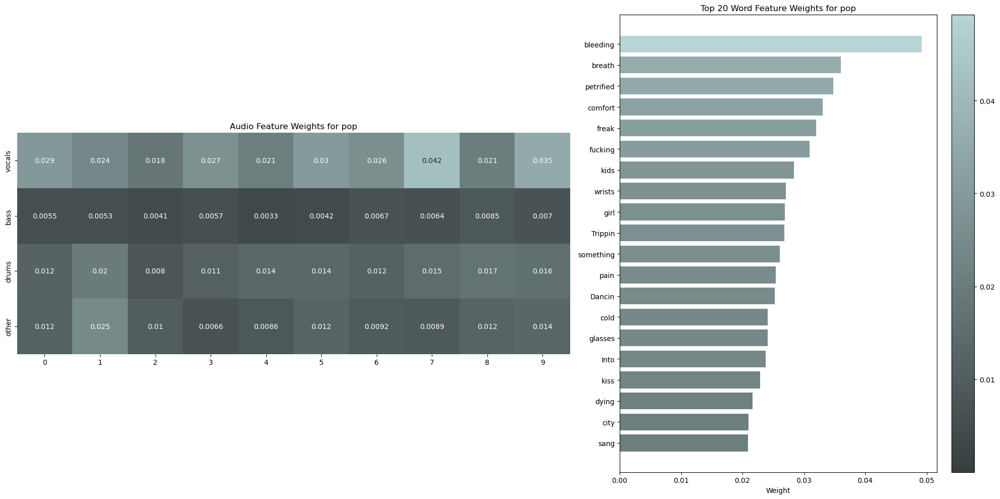

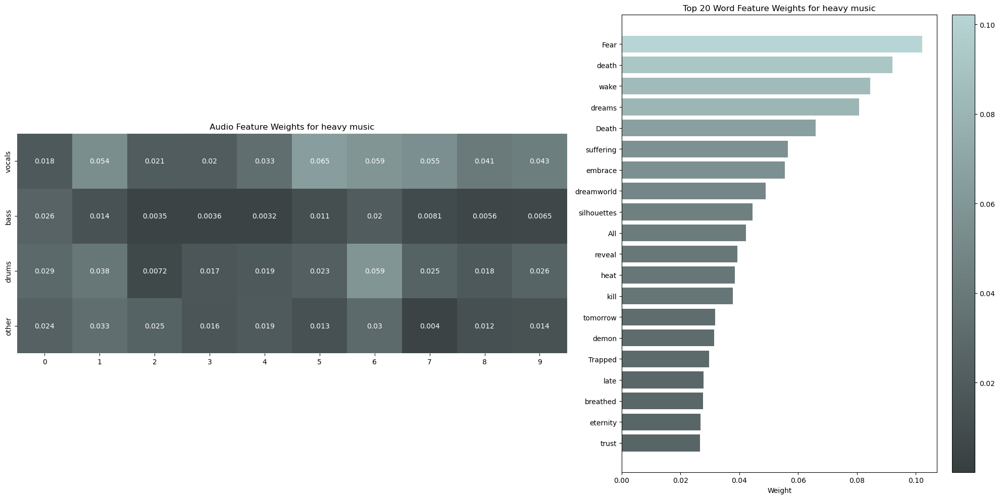

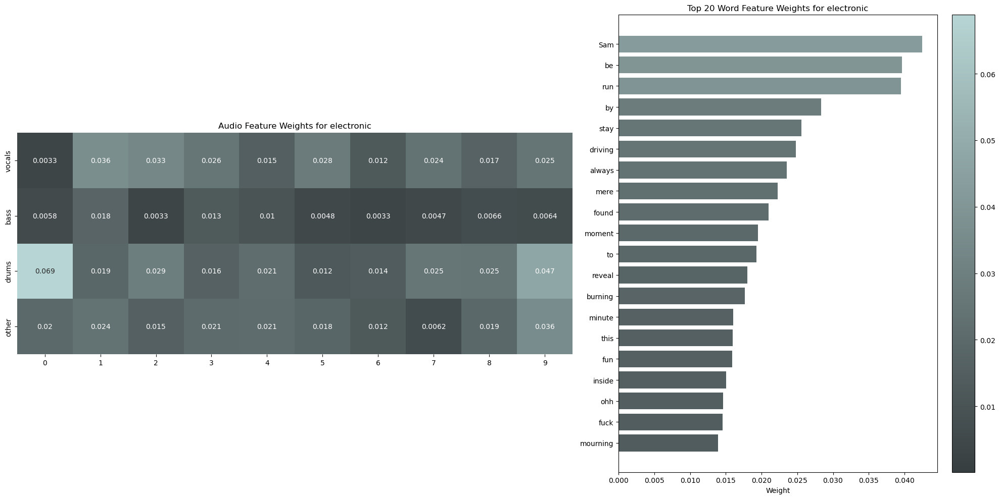

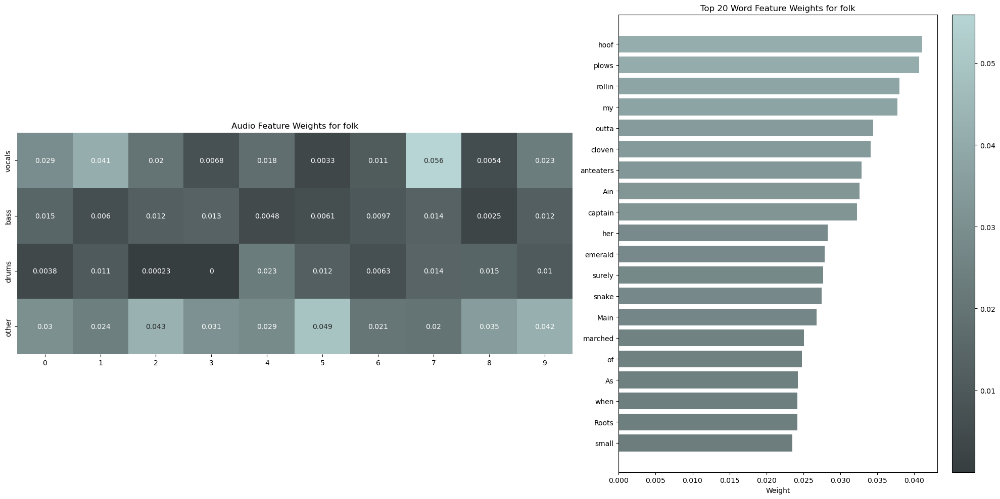

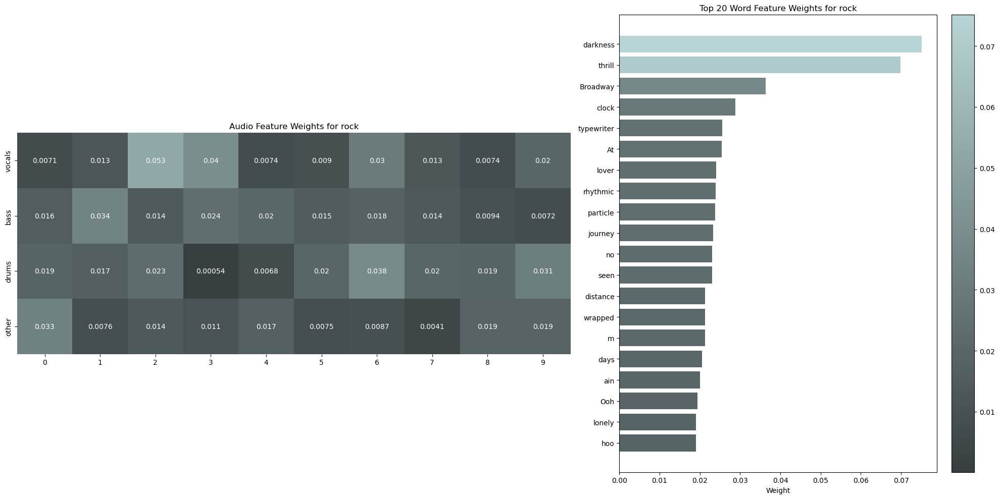

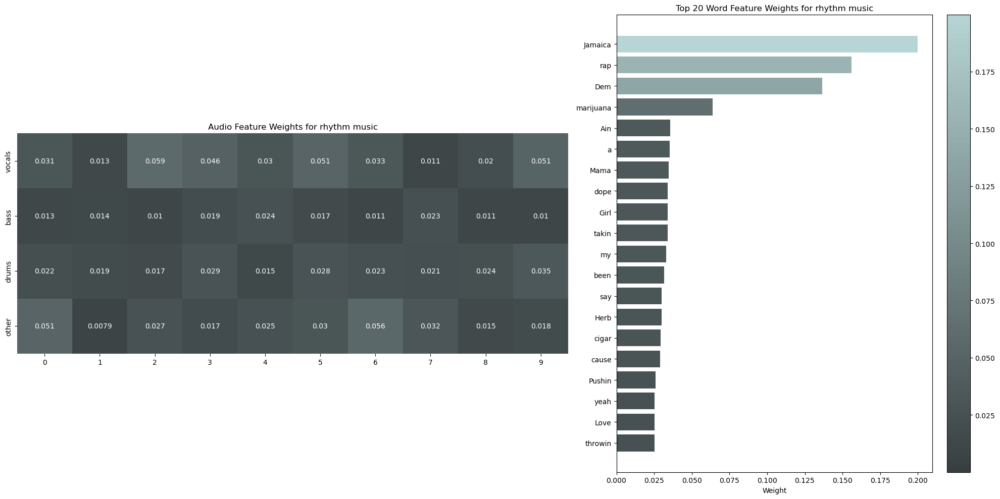

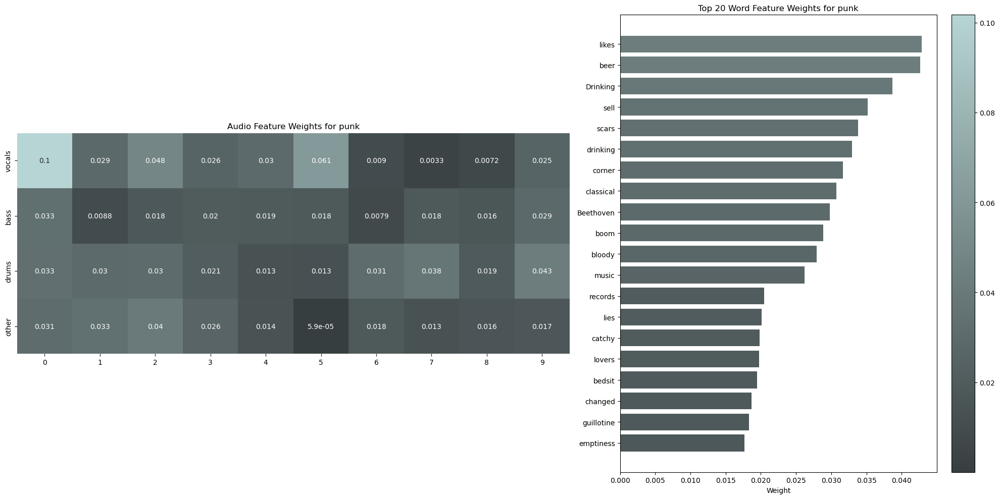

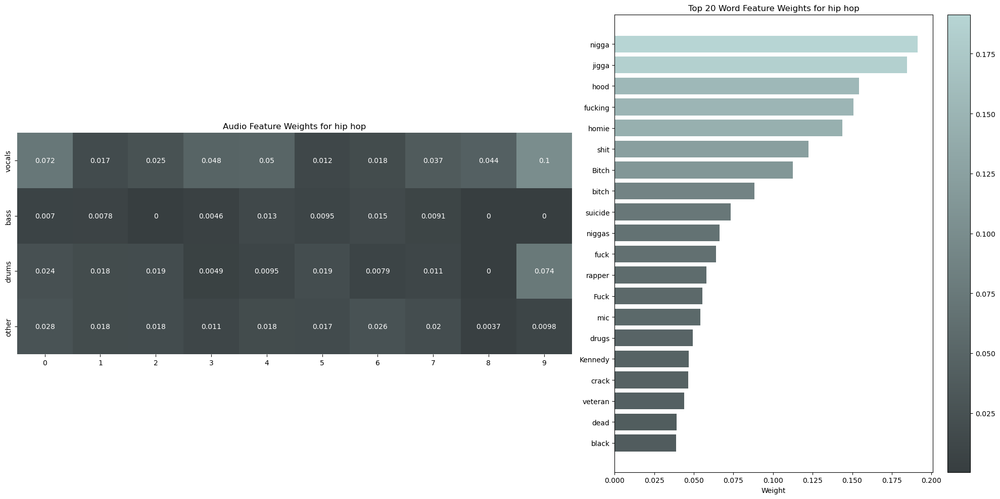

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap, Normalize

# Define the audio features
audio_features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
                  'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
                  'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
                  'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9']

# Define categories for audio features
categories = {
    'vocals': ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 
               'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9'],
    'bass': ['bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 
             'bass6', 'bass7', 'bass8', 'bass9'],
    'drums': ['drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 
              'drums6', 'drums7', 'drums8', 'drums9'],
    'other': ['other0', 'other1', 'other2', 'other3', 'other4', 'other5', 
              'other6', 'other7', 'other8', 'other9']
}

colors = ["#373E40", "#B7D5D4"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

for cls, feats in top_features_per_class.items():
    
    audio_feats = [(f, w) for f, w in feats if f in audio_features]
    word_feats = [(f, w) for f, w in feats if f not in audio_features]
    
    word_feats = sorted(word_feats, key=lambda x: x[1], reverse=True)[:20]
    weight_matrix_audio = {cat: [0]*(int(len(audio_features)/4)) for cat in categories}
    
    for feature, weight in audio_feats:
        for cat, cat_features in categories.items():
            if feature in cat_features:
                weight_matrix_audio[cat][cat_features.index(feature)] = weight

    word_labels = [feature for feature, weight in word_feats]
    word_weights = [weight for feature, weight in word_feats]

    # Determine global min and max weights
    all_weights = [weight for feature, weight in feats]
    min_weight = min(all_weights)
    max_weight = max(all_weights)
    
    # Normalize using global min and max weights
    norm = Normalize(vmin=min_weight, vmax=max_weight)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [3, 2]})
    
    heatmap_data_audio = []
    yticklabels_audio = []
    for cat, weights in weight_matrix_audio.items():
        heatmap_data_audio.append(weights)
        yticklabels_audio.append(cat)
    
    heatmap_data_audio = np.array(heatmap_data_audio)
    sns.heatmap(heatmap_data_audio, annot=True, cmap=cmap, yticklabels=yticklabels_audio, square=True, ax=ax1, cbar=False, norm=norm)
    ax1.set_title(f'Audio Feature Weights for {cls}')
    
    # Plot the word feature bar plot with colors from colormap
    bar_colors = cmap(norm(word_weights))
    bars = ax2.barh(word_labels, word_weights, color=bar_colors)
    ax2.set_yticks(np.arange(len(word_labels)))
    ax2.set_yticklabels(word_labels)
    ax2.invert_yaxis()  # Invert y-axis to have the highest weight on top
    ax2.set_xlabel('Weight')
    ax2.set_title(f'Top 20 Word Feature Weights for {cls}')

    # Add custom colorbar to the figure
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax2, orientation='vertical', fraction=0.1, pad=0.04)
    
    plt.tight_layout()
#     plt.savefig(f'../images/XAI/multimodal_heatmap&barplot_{cls}_AVG.png', bbox_inches='tight')
    plt.show()


## Emotion Multimodal (m4a)

In [23]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('emotion_multimodal_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('emotion_multimodal_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)
    
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [24]:
top_features_per_class = {
        emotion_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_AVG
    }

top_features_per_class

{'Happy': [('drums9', 0.07462985895113215),
  ('drums1', 0.050189469287963744),
  ('drums0', 0.04859498354424208),
  ('other9', 0.04603743740822797),
  ('drums8', 0.03689168804360274),
  ('drums2', 0.031275512765673336),
  ('drums3', 0.031236328468201156),
  ('drums4', 0.0310053049568389),
  ('drums5', 0.030633445515110835),
  ('other0', 0.026897514221473545),
  ('other2', 0.026686878505925802),
  ('reggae', 0.026668816786766518),
  ('drums7', 0.026086588637030315),
  ('drums6', 0.02541819395094292),
  ('other8', 0.02389967804078134),
  ('vocals9', 0.021867972970651944),
  ('other5', 0.021372925818418105),
  ('vocals0', 0.01990689170391548),
  ('dem', 0.01965994365301306),
  ('bass5', 0.01934871694207598),
  ('other7', 0.018908685344169642),
  ('vocals8', 0.017946784762581287),
  ('other1', 0.017483406681086666),
  ('rat', 0.017336937207964524),
  ('jokin', 0.01443019869326455),
  ('bass8', 0.014378243538225153),
  ('bo', 0.013956930374870466),
  ('bass0', 0.013243125261063252),
  ('vo

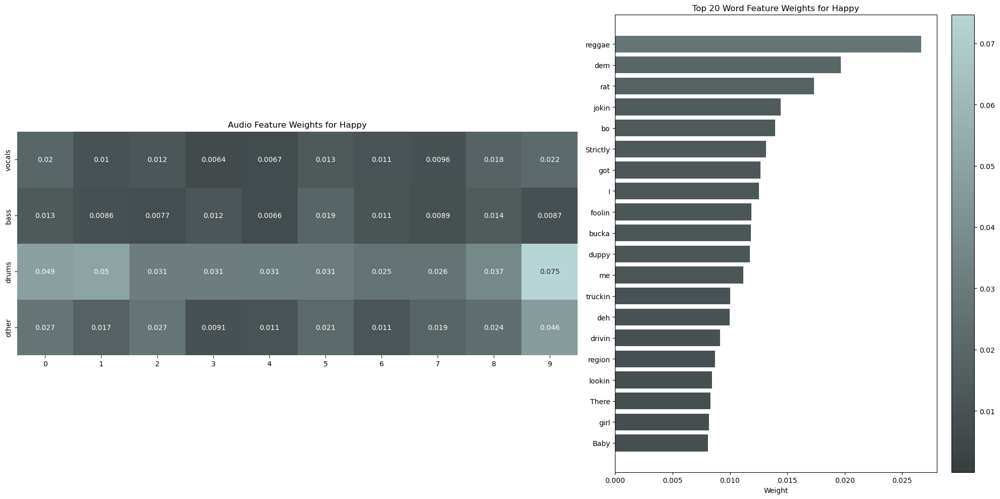

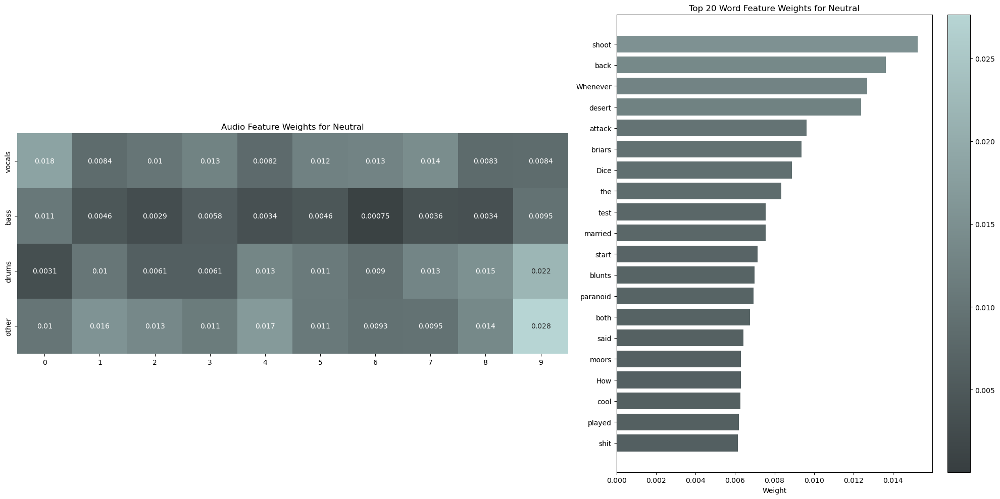

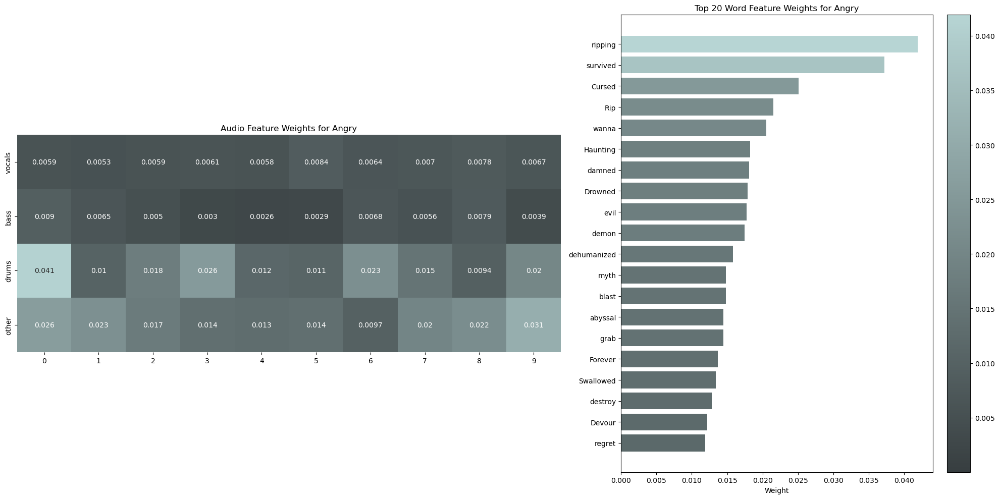

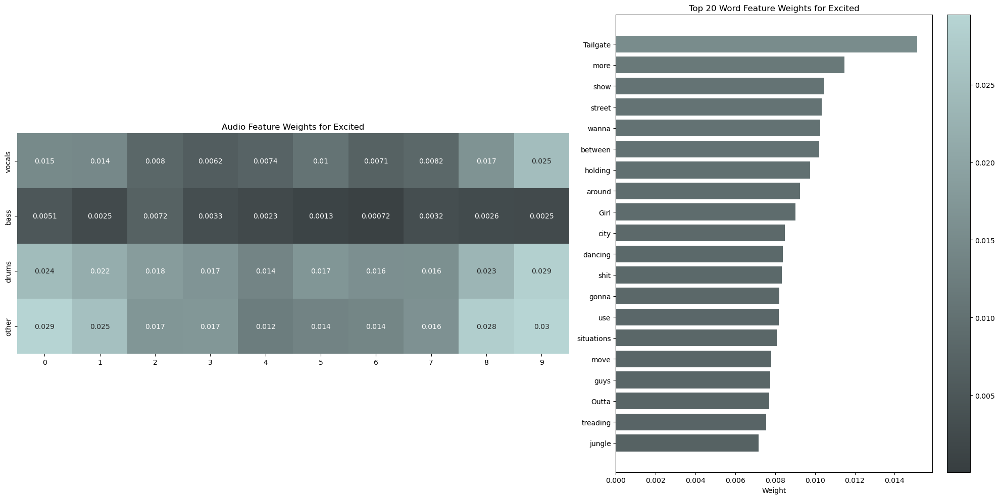

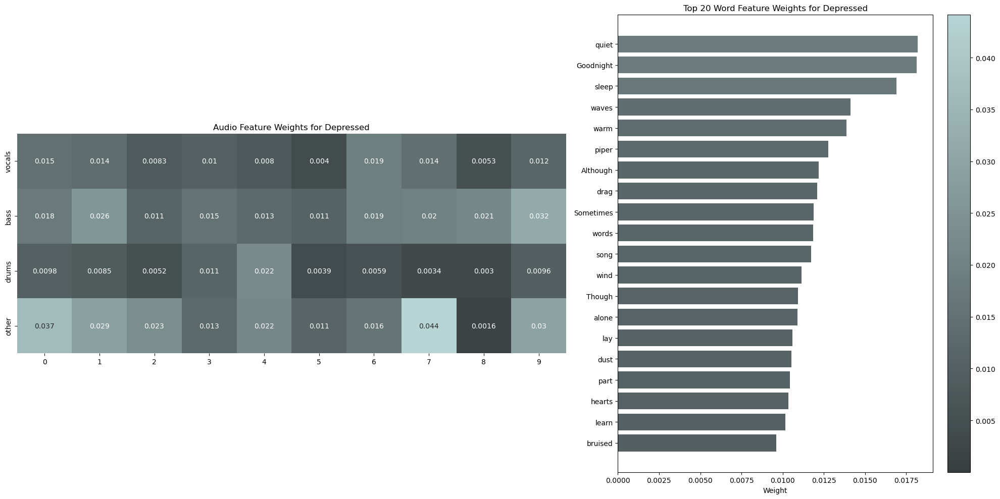

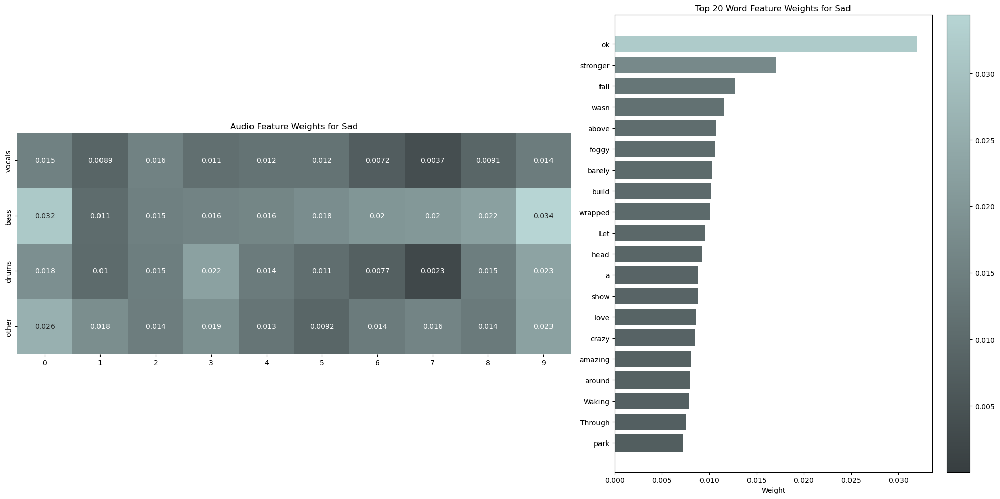

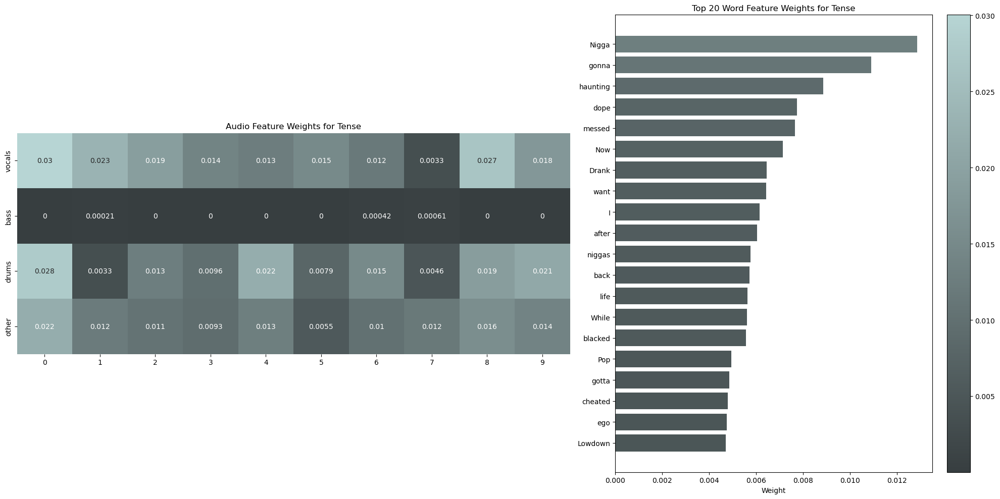

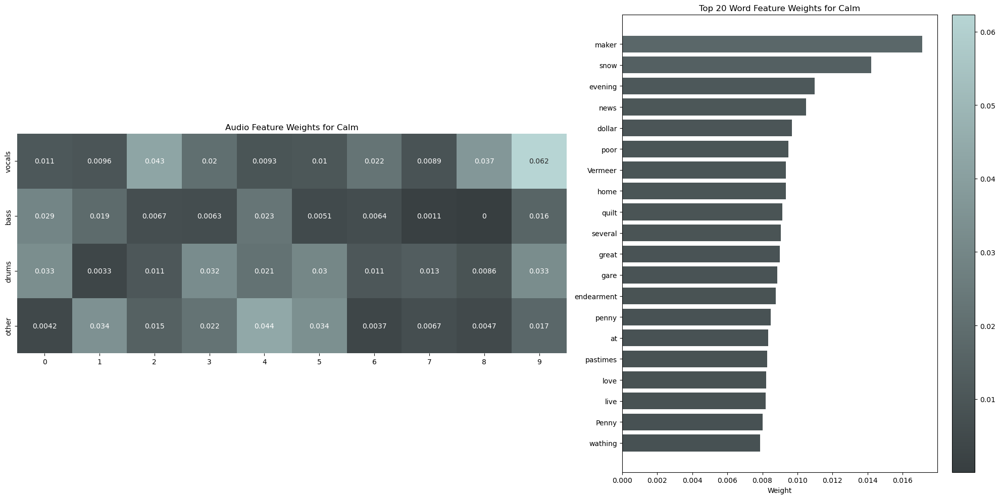

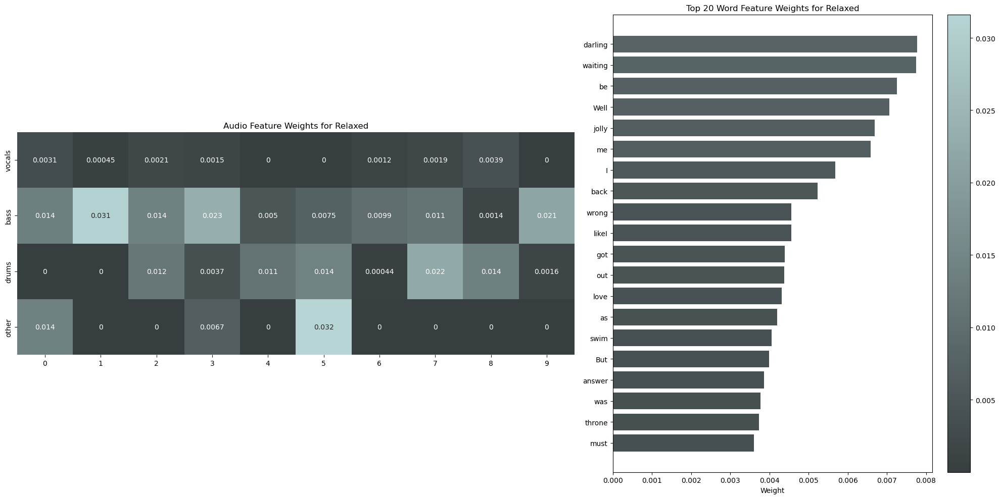

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap, Normalize

# Define the audio features
audio_features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
                  'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
                  'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
                  'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9']

# Define categories for audio features
categories = {
    'vocals': ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 
               'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9'],
    'bass': ['bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 
             'bass6', 'bass7', 'bass8', 'bass9'],
    'drums': ['drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 
              'drums6', 'drums7', 'drums8', 'drums9'],
    'other': ['other0', 'other1', 'other2', 'other3', 'other4', 'other5', 
              'other6', 'other7', 'other8', 'other9']
}

colors = ["#373E40", "#B7D5D4"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

for cls, feats in top_features_per_class.items():
    
    audio_feats = [(f, w) for f, w in feats if f in audio_features]
    word_feats = [(f, w) for f, w in feats if f not in audio_features]
    
    word_feats = sorted(word_feats, key=lambda x: x[1], reverse=True)[:20]
    weight_matrix_audio = {cat: [0]*(int(len(audio_features)/4)) for cat in categories}
    
    for feature, weight in audio_feats:
        for cat, cat_features in categories.items():
            if feature in cat_features:
                weight_matrix_audio[cat][cat_features.index(feature)] = weight

    word_labels = [feature for feature, weight in word_feats]
    word_weights = [weight for feature, weight in word_feats]

    # Determine global min and max weights
    all_weights = [weight for feature, weight in feats]
    min_weight = min(all_weights)
    max_weight = max(all_weights)
    
    # Normalize using global min and max weights
    norm = Normalize(vmin=min_weight, vmax=max_weight)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [3, 2]})
    
    heatmap_data_audio = []
    yticklabels_audio = []
    for cat, weights in weight_matrix_audio.items():
        heatmap_data_audio.append(weights)
        yticklabels_audio.append(cat)
    
    heatmap_data_audio = np.array(heatmap_data_audio)
    sns.heatmap(heatmap_data_audio, annot=True, cmap=cmap, yticklabels=yticklabels_audio, square=True, ax=ax1, cbar=False, norm=norm)
    ax1.set_title(f'Audio Feature Weights for {cls}')
    
    # Plot the word feature bar plot with colors from colormap
    bar_colors = cmap(norm(word_weights))
    bars = ax2.barh(word_labels, word_weights, color=bar_colors)
    ax2.set_yticks(np.arange(len(word_labels)))
    ax2.set_yticklabels(word_labels)
    ax2.invert_yaxis()  # Invert y-axis to have the highest weight on top
    ax2.set_xlabel('Weight')
    ax2.set_title(f'Top 20 Word Feature Weights for {cls}')

    # Add custom colorbar to the figure
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax2, orientation='vertical', fraction=0.1, pad=0.04)
    
    plt.tight_layout()
    # plt.savefig(f'../images/XAI/multimodal_heatmap&barplot_{cls}_AVG.png', bbox_inches='tight')
    plt.show()


### Audioset Lyrics

In [9]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('audioset_lyrics_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('audioset_lyrics_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)

In [12]:
present_genres = ["electronic", "folk", "heavy music", "hip hop", "pop", "rhythm music", "rock_altrock_punk"]
secondary_label_encoder = LabelEncoder()
secondary_label_encoder.fit(present_genres)

LabelEncoder()

In [21]:
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [22]:
top_features_per_class = {
        secondary_label_encoder.inverse_transform([label])[0]: sorted(Icj_H[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_H
    }

top_features_per_class

{'folk': [('country', 1.1106425511556486),
  ('likeAnd', 0.6467696366462992),
  ('And', 0.6351773196379248),
  ('Country', 0.5677289448946192),
  ('likeThis', 0.5666121245320627),
  ('hillbilly', 0.5534682004865008),
  ('long', 0.4841354067065272),
  ('might', 0.47075760218759627),
  ('ole', 0.4684438785010387),
  ('song', 0.4563239765125622),
  ('still', 0.44790589923424967),
  ('liked', 0.4416062103642102),
  ('likeShe', 0.43413006802216897),
  ('also', 0.4264162139398857),
  ('river', 0.42504714181136405),
  ('too', 0.42020607817749617),
  ('But', 0.41210631229971184),
  ('likeWell', 0.4079213479317874),
  ('heart', 0.40413414702846795),
  ('OWNYou', 0.40408679958500293),
  ('likeYear', 0.40018973401095437),
  ('a', 0.3965489296278281),
  ('likeAt', 0.3951979315394599),
  ('mine', 0.395077152666015),
  ('likeForget', 0.39433949924530937),
  ('likeWith', 0.39402301977211823),
  ('fell', 0.3898066816100864),
  ('homeYou', 0.38668112717067543),
  ('sunYou', 0.38562087348528157),
  ('li

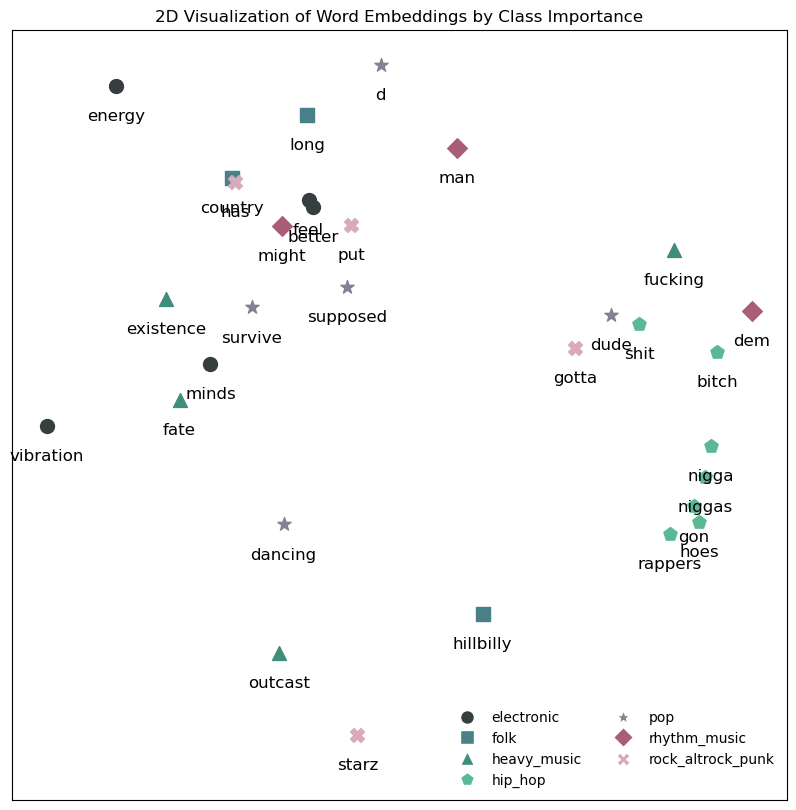

In [54]:
plot_feature_importance(Icj_H, glove_embeddings, secondary_label_encoder, N=7, repo_path='../images/emotion_global.png')

### AudioSet Multimodal

In [3]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('audioset_multimodal_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('audioset_multimodal_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)

In [4]:
present_genres = ["electronic", "folk", "heavy_music", "hip_hop", "pop", "rhythm_music", "rock_altrock_punk"]
secondary_label_encoder = LabelEncoder()
secondary_label_encoder.fit(present_genres)

LabelEncoder()

In [6]:
Icj_LIME, Icj_AVG, Icj_H = calculate_feature_influences(feature_weights, feature_counts)

In [7]:
top_features_per_class = {
        secondary_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG[label].items(), key=lambda x: x[1], reverse=True)
        for label in Icj_AVG
    }

top_features_per_class

{'rock_altrock_punk': [('Karen', 0.1159494859467435),
  ('D', 0.09906403260610117),
  ('fine', 0.08693283314510444),
  ('Dan', 0.05699139095067973),
  ('dumb', 0.04954268818740613),
  ('truth', 0.04903663654336962),
  ('fuck', 0.04581186509677824),
  ('better', 0.04267811614332142),
  ('claws', 0.04032009133806234),
  ('liked', 0.038870976748705946),
  ('feeling', 0.037892753148560616),
  ('saccharine', 0.037614944386522575),
  ('Motorway', 0.03602391022509716),
  ('teenage', 0.035299765978167044),
  ('Ooh', 0.03337841667304985),
  ('ears', 0.032484906383305194),
  ('wheel', 0.03212287613765582),
  ('shape', 0.030594302576412217),
  ('Waste', 0.03043576523782812),
  ('S', 0.030426475965853586),
  ('Trust', 0.030403402816322932),
  ('catcall', 0.02997745547579303),
  ('woho', 0.02923445915129169),
  ('ants', 0.02917373941320483),
  ('trash', 0.02907009170151085),
  ('woah', 0.02895963805824956),
  ('da', 0.028838786845219195),
  ('hair', 0.028575790141638604),
  ('Woah', 0.0277285570869

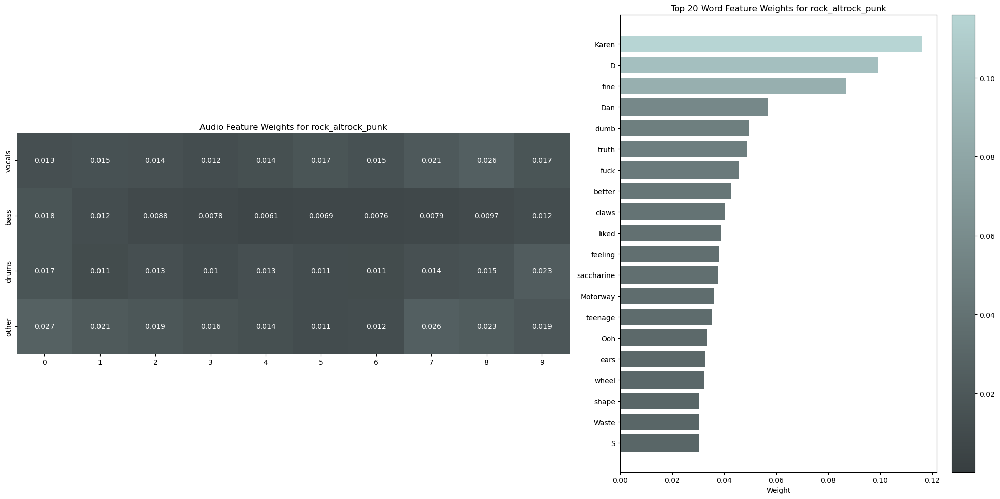

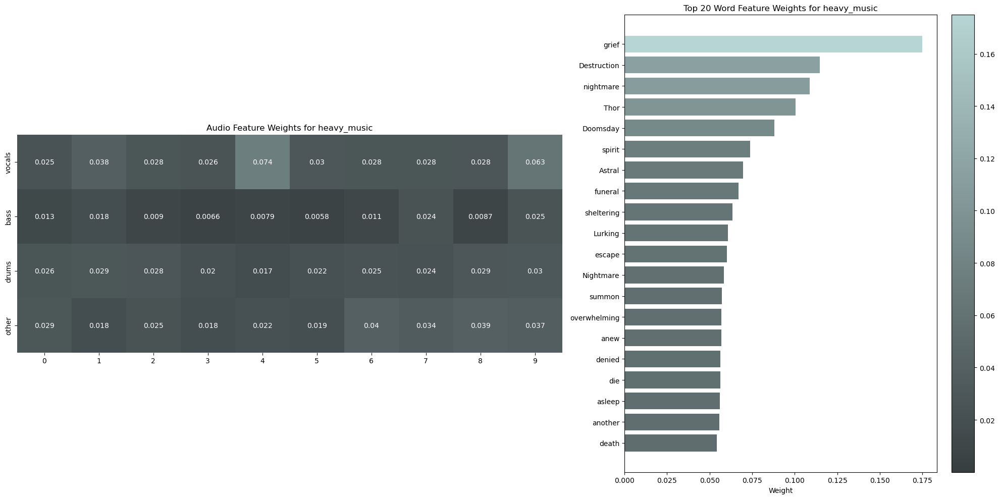

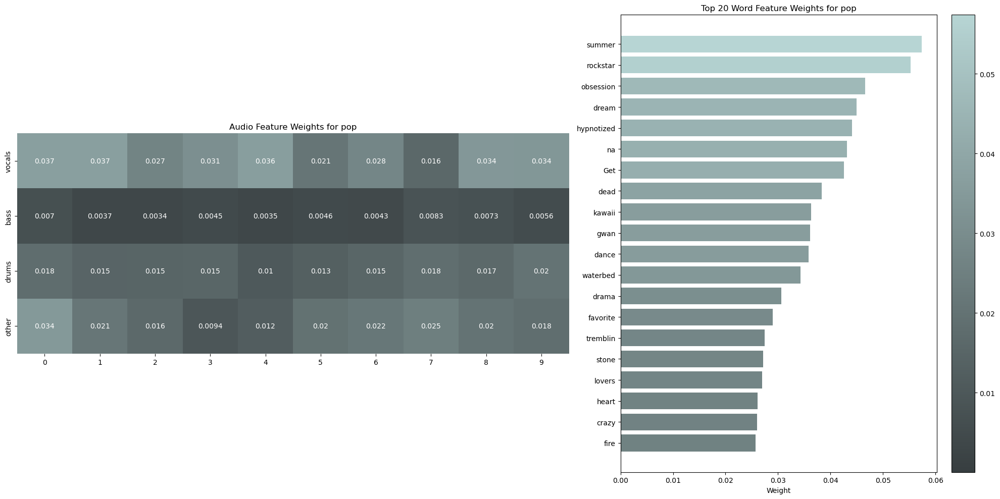

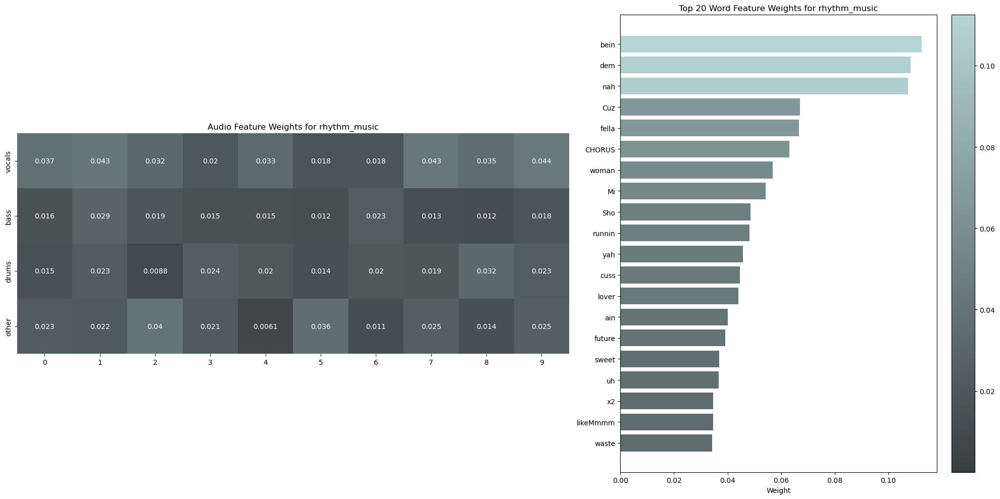

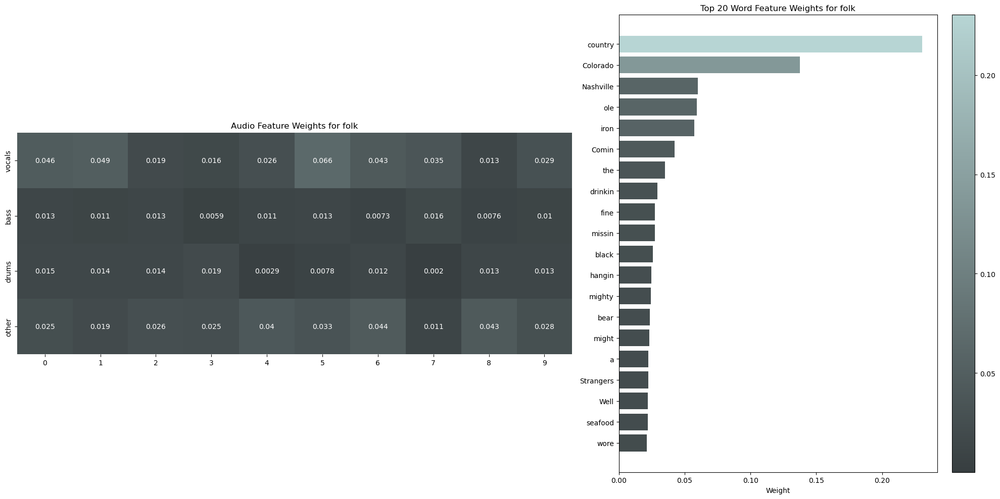

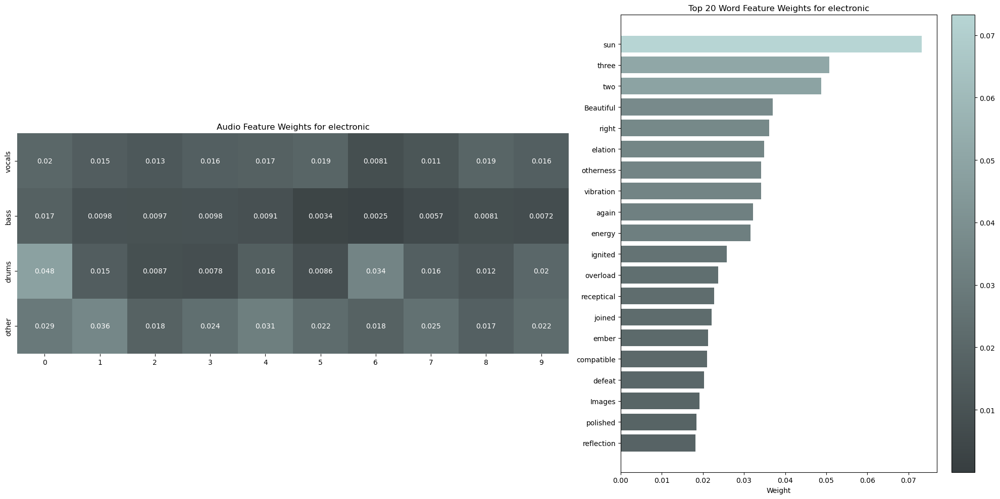

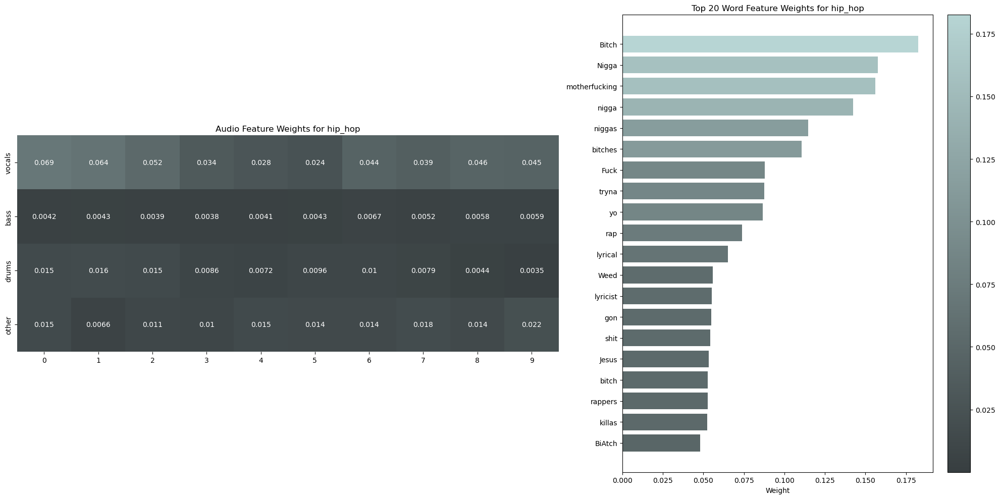

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap, Normalize

audio_features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
                  'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
                  'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
                  'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9']

categories = {
    'vocals': ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 
               'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9'],
    'bass': ['bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 
             'bass6', 'bass7', 'bass8', 'bass9'],
    'drums': ['drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 
              'drums6', 'drums7', 'drums8', 'drums9'],
    'other': ['other0', 'other1', 'other2', 'other3', 'other4', 'other5', 
              'other6', 'other7', 'other8', 'other9']
}

colors = ["#373E40", "#B7D5D4"]
cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

for cls, feats in top_features_per_class.items():
    
    audio_feats = [(f, w) for f, w in feats if f in audio_features]
    word_feats = [(f, w) for f, w in feats if f not in audio_features]
    
    word_feats = sorted(word_feats, key=lambda x: x[1], reverse=True)[:20]
    weight_matrix_audio = {cat: [0]*(int(len(audio_features)/4)) for cat in categories}
    
    for feature, weight in audio_feats:
        for cat, cat_features in categories.items():
            if feature in cat_features:
                weight_matrix_audio[cat][cat_features.index(feature)] = weight

    word_labels = [feature for feature, weight in word_feats]
    word_weights = [weight for feature, weight in word_feats]

    all_weights = [weight for feature, weight in feats]
    min_weight = min(all_weights)
    max_weight = max(all_weights)
    
    norm = Normalize(vmin=min_weight, vmax=max_weight)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [3, 2]})
    
    heatmap_data_audio = []
    yticklabels_audio = []
    for cat, weights in weight_matrix_audio.items():
        heatmap_data_audio.append(weights)
        yticklabels_audio.append(cat)
    
    heatmap_data_audio = np.array(heatmap_data_audio)
    sns.heatmap(heatmap_data_audio, annot=True, cmap=cmap, yticklabels=yticklabels_audio, square=True, ax=ax1, cbar=False, norm=norm)
    ax1.set_title(f'Audio Feature Weights for {cls}')
    
    bar_colors = cmap(norm(word_weights))
    bars = ax2.barh(word_labels, word_weights, color=bar_colors)
    ax2.set_yticks(np.arange(len(word_labels)))
    ax2.set_yticklabels(word_labels)
    ax2.invert_yaxis()  
    ax2.set_xlabel('Weight')
    ax2.set_title(f'Top 20 Word Feature Weights for {cls}')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    fig.colorbar(sm, ax=ax2, orientation='vertical', fraction=0.1, pad=0.04)
    
    plt.tight_layout()
    # plt.savefig(f'../images/XAI/multimodal_heatmap&barplot_{cls}_AVG.png', bbox_inches='tight')
    plt.show()

### AudioSet vs M4A

In [41]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('genre_multimodal_feature_weights_5000.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('genre_multimodal_feature_counts_5000.pkl', 'rb') as f:
    feature_counts = pickle.load(f)

feature_weights_m4a = merge_features_by_class(feature_weights)
feature_counts_m4a = merge_features_by_class(feature_counts)

In [42]:
def default_dict_of_float():
    return defaultdict(float)

def default_dict_of_int():
    return defaultdict(int)

with open('audioset_multimodal_feature_weights.pkl', 'rb') as f:
    feature_weights = pickle.load(f)

with open('audioset_multimodal_feature_counts.pkl', 'rb') as f:
    feature_counts = pickle.load(f)
    
feature_weights_audioset = merge_features_by_class(feature_weights)
feature_counts_audioset = merge_features_by_class(feature_counts)

In [43]:
Icj_LIME_audioset, Icj_AVG_audioset, Icj_H_audioset = calculate_feature_influences(feature_weights_audioset, feature_counts_audioset)
Icj_LIME_m4a, Icj_AVG_m4a, Icj_H_m4a = calculate_feature_influences(feature_weights_m4a, feature_counts_m4a)

In [44]:
top_features_per_class_audioset = {
        secondary_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG_audioset[label].items(), key=lambda x: x[1], reverse=True)[:100]
        for label in Icj_AVG_audioset
    }
top_features_per_class_m4a = {
        genre_label_encoder.inverse_transform([label])[0]: sorted(Icj_AVG_m4a[label].items(), key=lambda x: x[1], reverse=True)[:100]
        for label in Icj_AVG_m4a
    }

In [45]:
merged_classes_m4a = {
    'rock_altrock_punk': ['punk', 'rock', 'alternative rock']
}

audio_features = ['vocals0', 'vocals1', 'vocals2', 'vocals3', 'vocals4', 'vocals5', 'vocals6', 'vocals7', 'vocals8', 'vocals9', 
                  'bass0', 'bass1', 'bass2', 'bass3', 'bass4', 'bass5', 'bass6', 'bass7', 'bass8', 'bass9',
                  'drums0', 'drums1', 'drums2', 'drums3', 'drums4', 'drums5', 'drums6', 'drums7', 'drums8', 'drums9', 
                  'other0', 'other1', 'other2', 'other3', 'other4', 'other5', 'other6', 'other7', 'other8', 'other9']

for merged_class, original_classes in merged_classes_m4a.items():
    merged_features = []
    for original_class in original_classes:
        if original_class in top_features_per_class_m4a:
            merged_features += top_features_per_class_m4a.pop(original_class)
    top_features_per_class_m4a[merged_class] = sorted(merged_features, key=lambda x: x[1], reverse=True)

def filter_lyrical_features(feature_dict):
    return {label: sorted([(feat, score) for feat, score in features if feat not in audio_features], key=lambda x: x[1], reverse=True)
            for label, features in feature_dict.items()}

top_features_per_class_m4a = filter_lyrical_features(top_features_per_class_m4a)
top_features_per_class_audioset = filter_lyrical_features(top_features_per_class_audioset)

In [15]:
def plot_vs_datasets(top_features_per_class_m4a, top_features_per_class_audioset, genres, repo_path, N=10):
        
    all_words = []
    all_embeddings = []
    all_labels = []

    for label, features in top_features_per_class_m4a.items():
        if label in genres:
            for word, weight in features[:N]:
                if word in glove_embeddings:
                    all_words.append(word)
                    all_embeddings.append(glove_embeddings[word])
                    all_labels.append('Music4All ' + label)
                    
    for label, features in top_features_per_class_audioset.items():
        if label in genres:
            for word, weight in features[:N]:
                if word in glove_embeddings:
                    all_words.append(word)
                    all_embeddings.append(glove_embeddings[word])
                    all_labels.append('AudioSet ' + label)

    all_embeddings = np.array(all_embeddings)
    tsne = TSNE(n_components=2, random_state=0)
    reduced_embeddings = tsne.fit_transform(all_embeddings)
    
    plt.figure(figsize=(12, 10))
    unique_labels = list(set(all_labels))
    markers = ['o', 's', '^', 'p', '*', 'D', 'X', '<', '>']
    colors = ['#373e40', '#488286', '#408D7B', '#5AB894', '#868095', '#AA5D78', '#D7ABBB', '#B7D5D4', '#F9F871']
    colorindexes = [1, 5, 6, 2]

    for i, label in enumerate(unique_labels):
        indices = [index for index, l in enumerate(all_labels) if l == label]
        
        # Adjust marker size for squares ('s') to be larger (e.g., 150)
        marker_size = 150 if markers[colorindexes[i] % len(markers)] == 's' else 100
        
        plt.scatter(
            reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], 
            label=label, 
            marker=markers[colorindexes[i] % len(markers)], 
            color=colors[colorindexes[i] % len(markers)], 
            s=marker_size
        )

    # Annotate each word with its label
    for i, word in enumerate(all_words):
        plt.annotate(word, (reduced_embeddings[i, 0], reduced_embeddings[i, 1]), fontsize=12, xytext=(0, 5), textcoords='offset points')

    plt.xticks([])
    plt.yticks([])
    plt.legend(fontsize=10, markerscale=0.5, scatterpoints=1, loc='best')
    # plt.savefig(f"{repo_path}")
    plt.show()


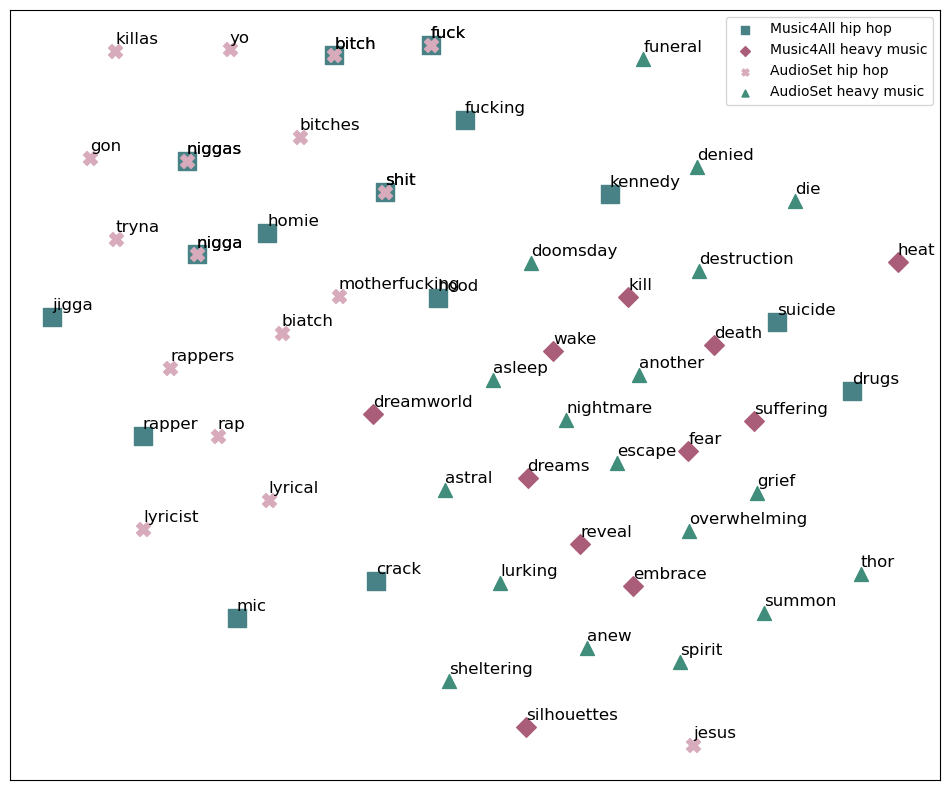

In [16]:
plot_vs_datasets(top_features_per_class_m4a, top_features_per_class_audioset, ['hip hop', 'heavy music'], N=20, repo_path='output')

In [80]:
def plot_feature_importance_dual_datasets(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=5, repo_path='output'):
    
    datasets = {
        'm4a': top_features_per_class_m4a,
        'audioset': top_features_per_class_audioset
    }
    
    markers_dataset = {
        'm4a': '^',  # Triangle marker for m4a dataset
        'audioset': 's'  # Square marker for audioset dataset
    }

    top_features_combined = {}
    for dataset, importance_scores in datasets.items():
        top_features_per_class = {
            label: sorted(importance_scores[label], key=lambda x: x[1], reverse=True)[:N]
            for label in importance_scores
        }
        top_features_combined[dataset] = top_features_per_class

    unique_features = list({feature for dataset in top_features_combined for label in top_features_combined[dataset] for feature, _ in top_features_combined[dataset][label] if feature in glove_embeddings})
    embeddings = np.array([glove_embeddings[feature] for feature in unique_features if feature in glove_embeddings])

    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)

    plt.figure(figsize=(10, 10))
    colors = ['#FFA000', '#FFECB3', '#009688', '#80CBC4', '#757575', '#BDBDBD', '#AED581', '#FFAB91', '#F9F871']

    for (x, y), word in zip(reduced_embeddings, unique_features):
        plt.scatter(x, y, alpha=0)
        plt.text(x, y + 0.03, word, fontsize=12, ha='center', va='center')  # Offset words slightly on the y-axis

        for dataset, top_features_per_class in top_features_combined.items():
            word_classes = [label for label, items in top_features_per_class.items() if any(item[0] == word for item in items)]
            angles = np.linspace(0, 2 * np.pi, len(word_classes) + 1)

            for i, label in enumerate(word_classes):
                dy, dx = np.cos(angles[i]) * 0.4, np.sin(angles[i]) * 0.05
                class_index = list(secondary_label_encoder.classes_).index(label)  # Get the index directly from the class names
                marker = markers_dataset[dataset]
                color = colors[class_index % len(colors)]
                plt.scatter(x + dx, y + dy, marker=marker, color=color, s=100)

    class_legend_entries = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i % len(colors)], markersize=10, label=secondary_label_encoder.classes_[i]) for i in range(len(secondary_label_encoder.classes_))]

    dataset_legend_entries = [plt.Line2D([0], [0], marker=markers_dataset[dataset], color='w', markerfacecolor='k', markersize=10, label=dataset) for dataset in markers_dataset]

    legend1 = plt.legend(handles=class_legend_entries, loc='lower left', ncol=2, framealpha=0, title="Classes")

    plt.legend(handles=dataset_legend_entries, loc='upper right', title="Datasets")
    plt.gca().add_artist(legend1)  # Adding the class legend back after dataset legend is placed
    
    plt.xticks([])
    plt.yticks([])
#     plt.title('2D Visualization of Word Embeddings by Class Importance for Two Datasets')
    plt.savefig(f'../images/XAI/multimodal_lyrics_datasets_vs', bbox_inches='tight')
    plt.show()


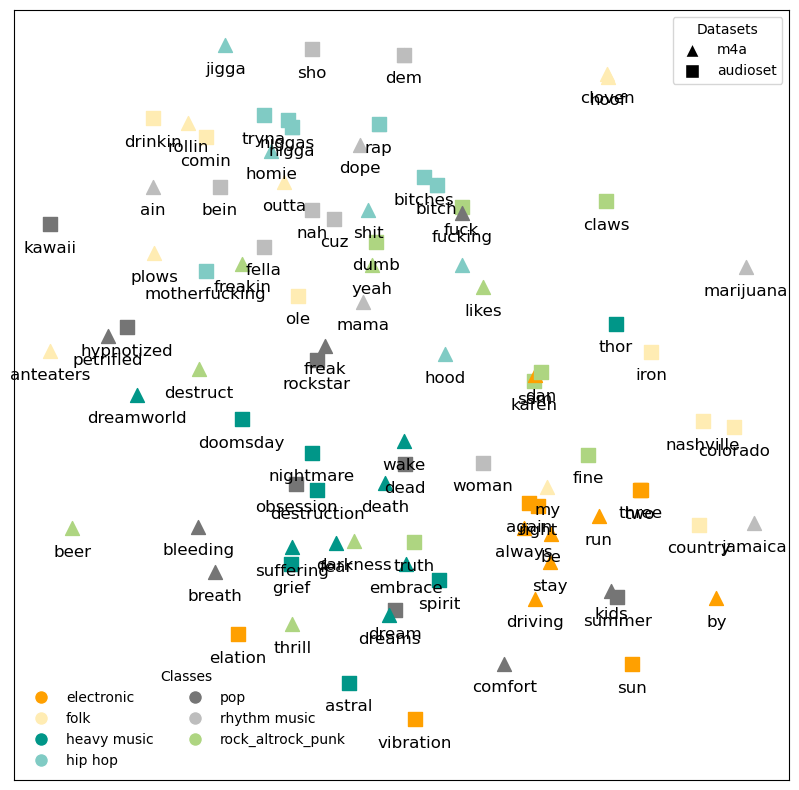

In [81]:
plot_feature_importance_dual_datasets(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=7, repo_path='output')

In [48]:
def plot_feature_importance_dual_datasets_2by2(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=5, repo_path='output'):
    
    datasets = {
        'm4a': top_features_per_class_m4a,
        'audioset': top_features_per_class_audioset
    }
    
    markers_dataset = {
        'm4a': '^',  
        'audioset': 's'  
    }
    
    
    colors = ['#FFA000', '#009688']

    all_classes = list(secondary_label_encoder.classes_)
    class_combinations = list(itertools.combinations(all_classes, 2))

    for class_pair in class_combinations:
        top_features_combined = {}
        for dataset, importance_scores in datasets.items():
            top_features_per_class = {
                label: sorted(importance_scores[label], key=lambda x: x[1], reverse=True)[:N]
                for label in importance_scores if label in class_pair
            }
            top_features_combined[dataset] = top_features_per_class

        unique_features = list({feature for dataset in top_features_combined for label in top_features_combined[dataset] for feature, _ in top_features_combined[dataset][label] if feature in glove_embeddings})
        embeddings = np.array([glove_embeddings[feature] for feature in unique_features if feature in glove_embeddings])

        tsne = TSNE(n_components=2, random_state=42)
        reduced_embeddings = tsne.fit_transform(embeddings)

        plt.figure(figsize=(10, 10))
        
        for (x, y), word in zip(reduced_embeddings, unique_features):
            plt.scatter(x, y, alpha=0)
            plt.text(x, y , word, fontsize=14, ha='center', va='center')
            for dataset, top_features_per_class in top_features_combined.items():
                word_classes = [label for label, items in top_features_per_class.items() if any(item[0] == word for item in items)]
                angles = np.linspace(0, 2 * np.pi, len(word_classes) + 1)

                for i, label in enumerate(word_classes):
                    dy, dx = np.cos(angles[i]) * 0.10, np.sin(angles[i]) * 0.05
                    class_index = class_pair.index(label)
                    marker = markers_dataset[dataset]
                    color = colors[class_index]
                    plt.scatter(x + dx, y + dy, marker=marker, color=color, s=150)

        class_legend_entries = [
            plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=10, label=class_pair[i])
            for i in range(2)
        ]
        dataset_legend_entries = [plt.Line2D([0], [0], marker=markers_dataset[dataset], color='w', markerfacecolor='k', markersize=10, label=dataset) for dataset in markers_dataset]

        legend1 = plt.legend(handles=class_legend_entries, loc='lower left', ncol=2, framealpha=0, title="Classes")
        plt.legend(handles=dataset_legend_entries, loc='upper right', title="Datasets")
        plt.gca().add_artist(legend1)

        plt.xticks([])
        plt.yticks([])
        class_pair_str = "_vs_".join(class_pair)
        plt.savefig(f'{repo_path}/multimodal_lyrics_datasets_vs_{class_pair_str}.png', bbox_inches='tight')
        plt.show()


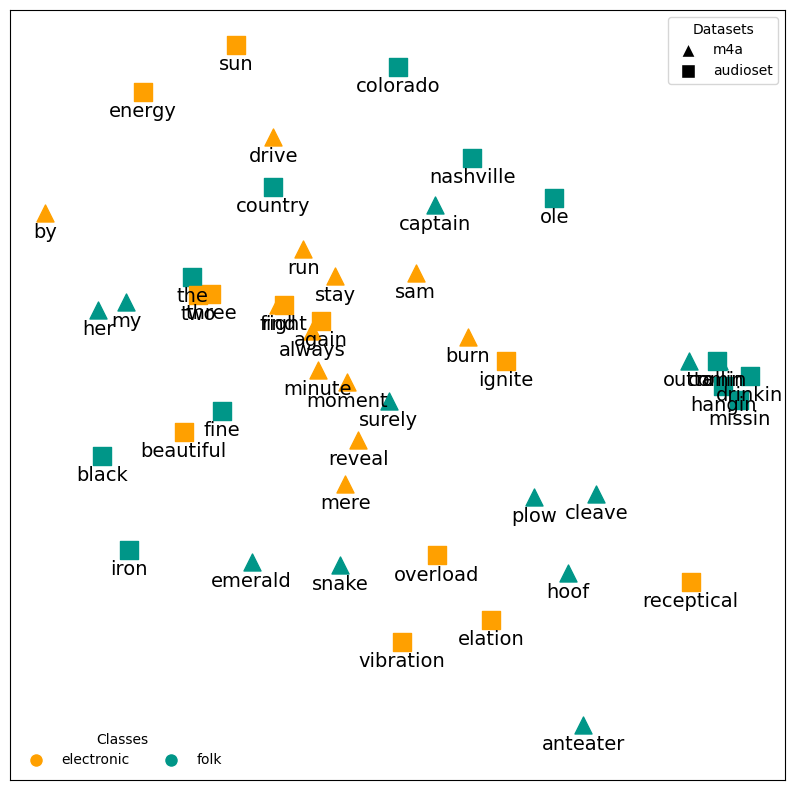

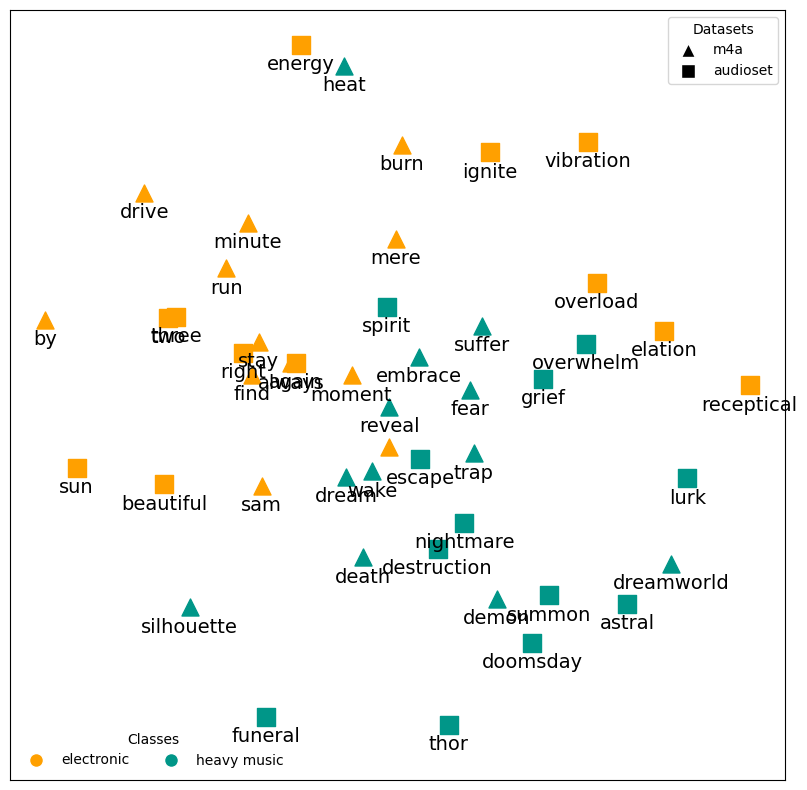

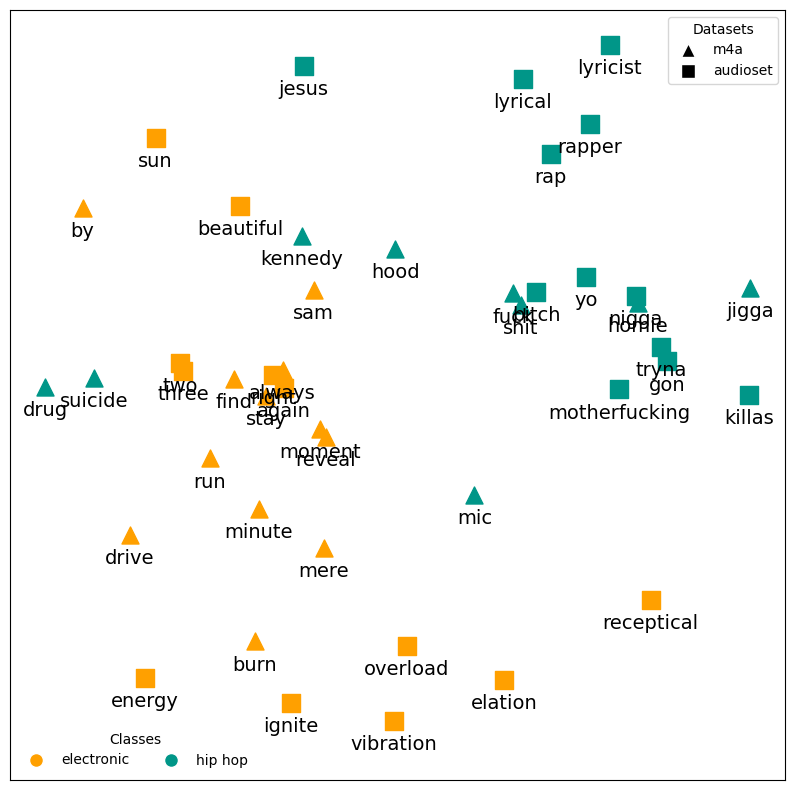

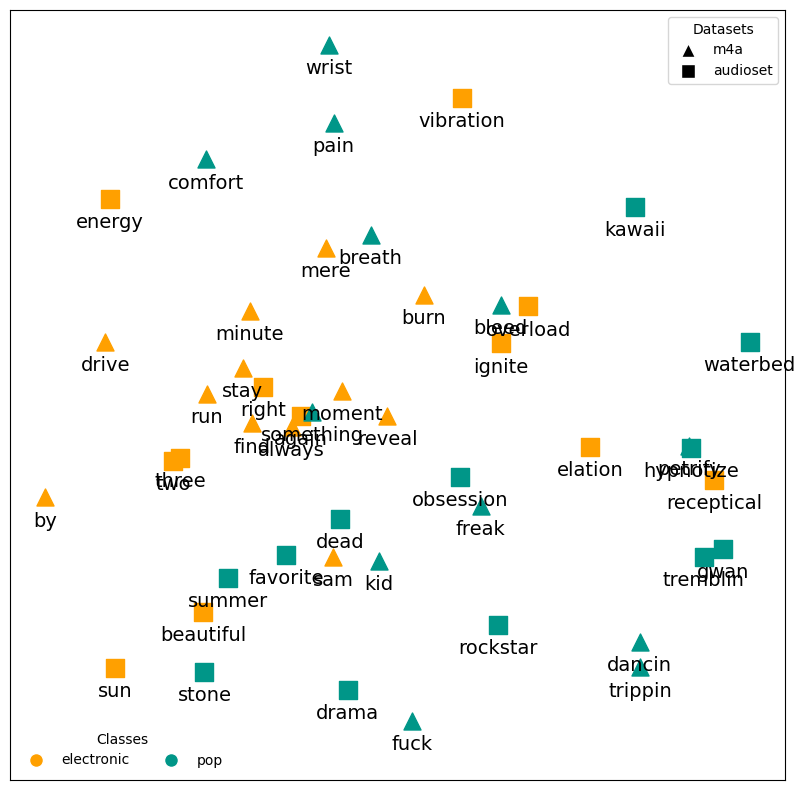

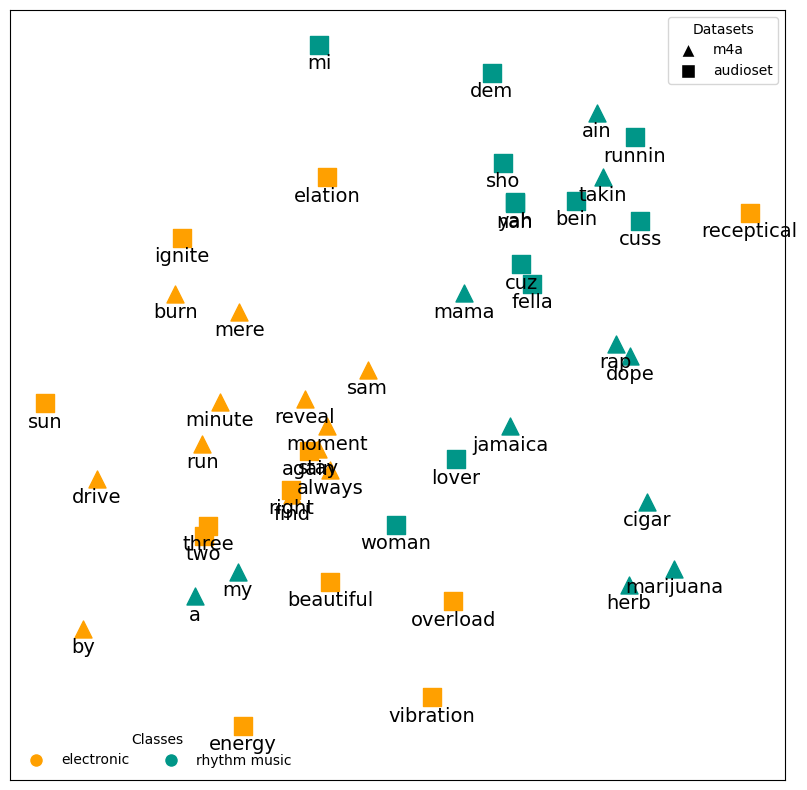

...

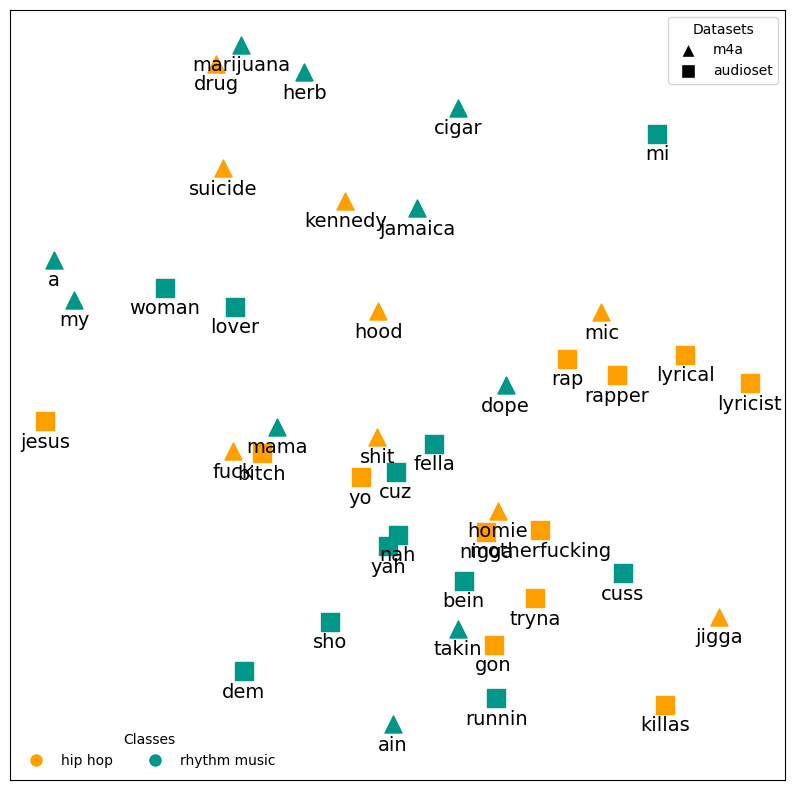

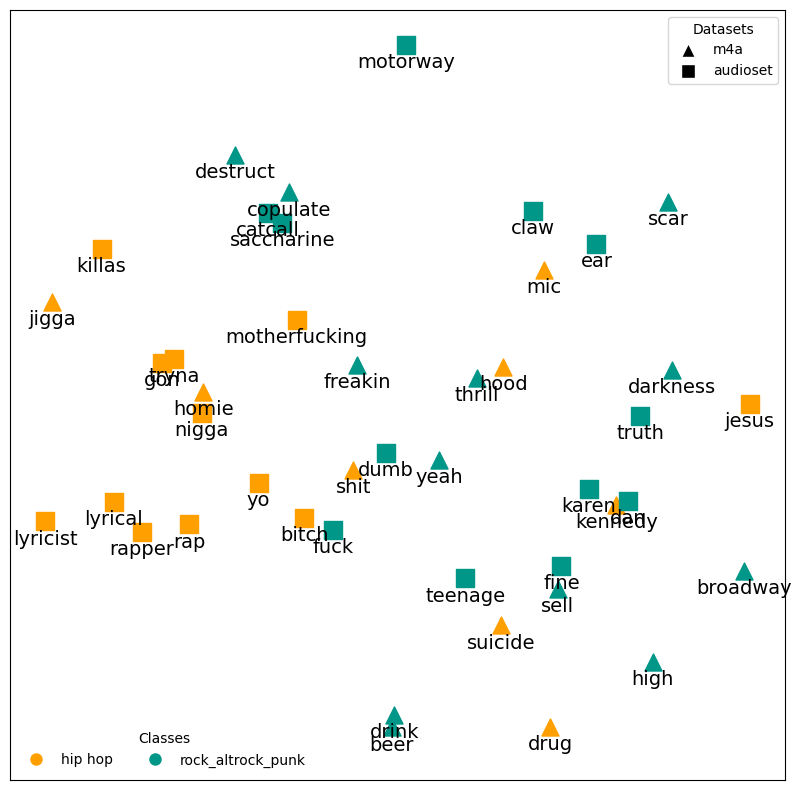

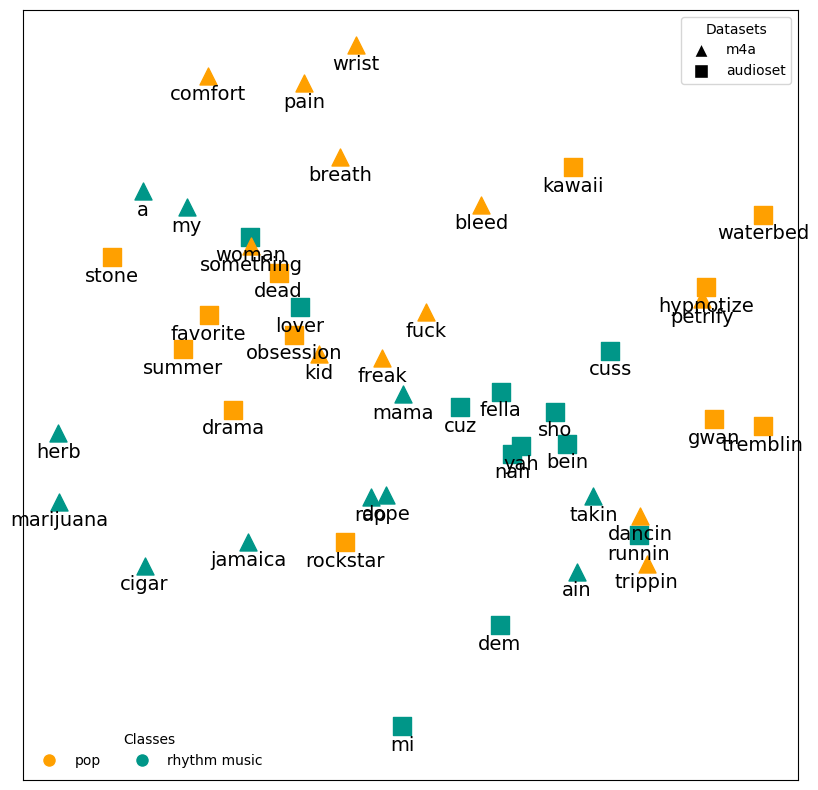

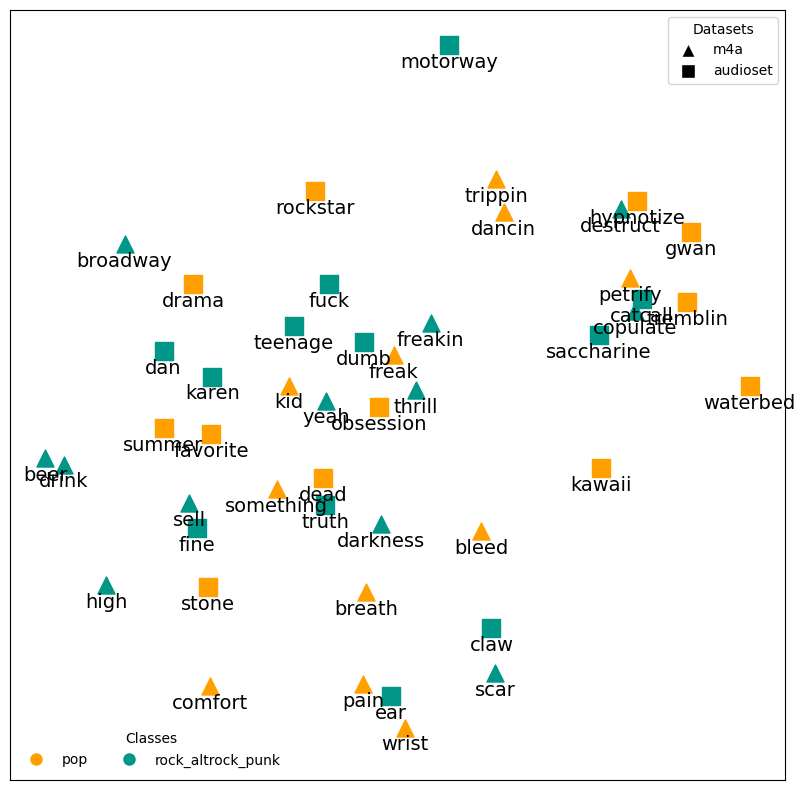

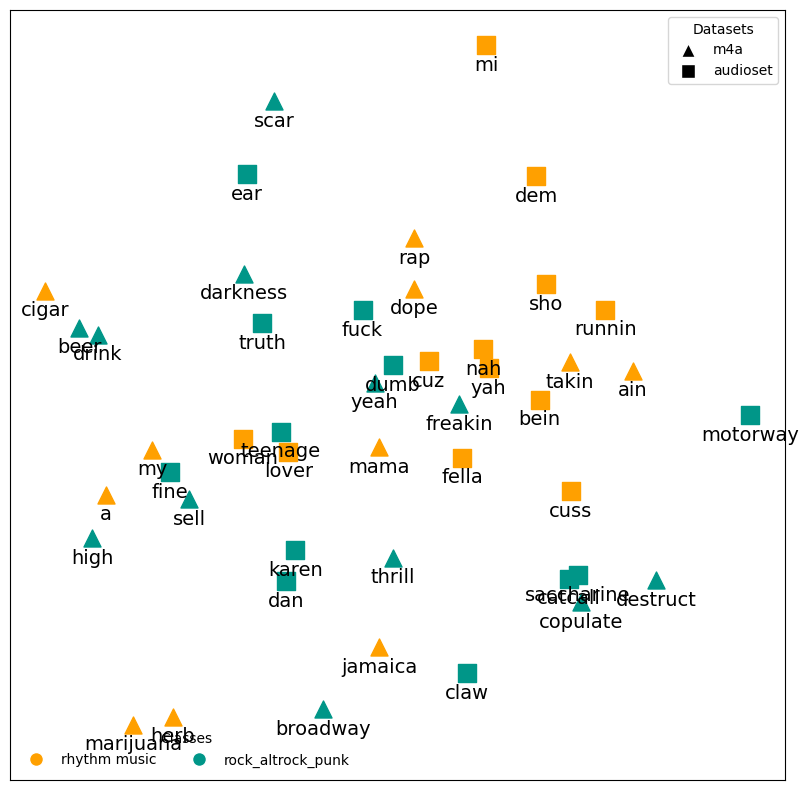

In [49]:
plot_feature_importance_dual_datasets_2by2(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=12, repo_path='../images/2vs')

In [53]:
def plot_feature_importance_dual_datasets_3by3(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=5, repo_path='output'):
    
    datasets = {
        'm4a': top_features_per_class_m4a,
        'audioset': top_features_per_class_audioset
    }
    
    markers_dataset = {
        'm4a': '^',  
        'audioset': 's'  
    }
    
    colors = ['#FFA000', '#009688', '#757575']

    all_classes = list(secondary_label_encoder.classes_)
    class_combinations = list(itertools.combinations(all_classes, 3))  # Changed to combinations of 3

    for class_triplet in class_combinations:
        top_features_combined = {}
        for dataset, importance_scores in datasets.items():
            top_features_per_class = {
                label: sorted(importance_scores[label], key=lambda x: x[1], reverse=True)[:N]
                for label in importance_scores if label in class_triplet
            }
            top_features_combined[dataset] = top_features_per_class

        unique_features = list({feature for dataset in top_features_combined for label in top_features_combined[dataset] for feature, _ in top_features_combined[dataset][label] if feature in glove_embeddings})
        embeddings = np.array([glove_embeddings[feature] for feature in unique_features if feature in glove_embeddings])

        tsne = TSNE(n_components=2, random_state=42)
        reduced_embeddings = tsne.fit_transform(embeddings)

        plt.figure(figsize=(10, 10))
        
        for (x, y), word in zip(reduced_embeddings, unique_features):
            plt.scatter(x, y, alpha=0)
            plt.text(x, y , word, fontsize=14, ha='center', va='center')
            for dataset, top_features_per_class in top_features_combined.items():
                word_classes = [label for label, items in top_features_per_class.items() if any(item[0] == word for item in items)]
                angles = np.linspace(0, 2 * np.pi, len(word_classes) + 1)

                for i, label in enumerate(word_classes):
                    dy, dx = np.cos(angles[i]) * 0.10, np.sin(angles[i]) * 0.05
                    class_index = class_triplet.index(label)
                    marker = markers_dataset[dataset]
                    color = colors[class_index]
                    plt.scatter(x + dx, y + dy, marker=marker, color=color, s=150)

        # Class legend for 3 classes
        class_legend_entries = [
            plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[i], markersize=10, label=class_triplet[i])
            for i in range(3)
        ]
        dataset_legend_entries = [plt.Line2D([0], [0], marker=markers_dataset[dataset], color='w', markerfacecolor='k', markersize=10, label=dataset) for dataset in markers_dataset]

        legend1 = plt.legend(handles=class_legend_entries, loc='lower left', ncol=3, framealpha=0, title="Classes")
        plt.legend(handles=dataset_legend_entries, loc='upper right', title="Datasets")
        plt.gca().add_artist(legend1)

        plt.xticks([])
        plt.yticks([])

        class_triplet_str = "_vs_".join(class_triplet)
        plt.savefig(f'{repo_path}/multimodal_lyrics_datasets_vs_{class_triplet_str}.png', bbox_inches='tight')
        plt.show()

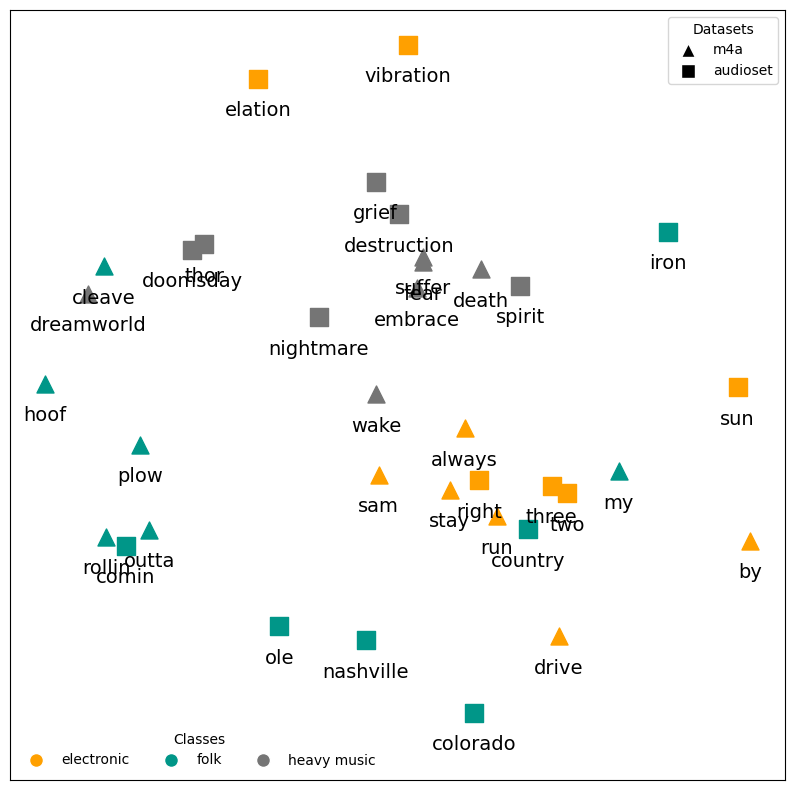

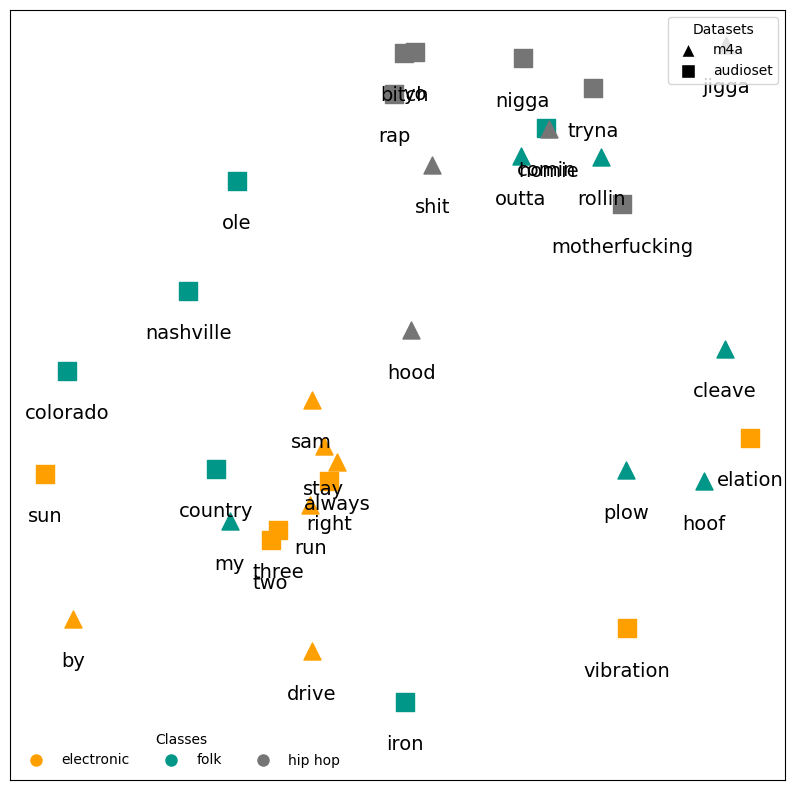

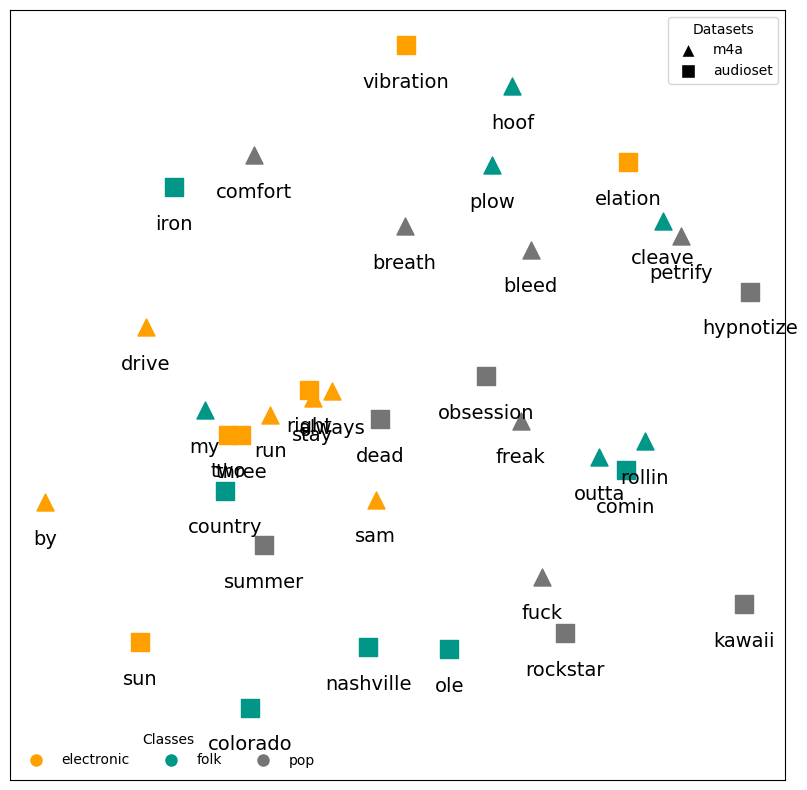

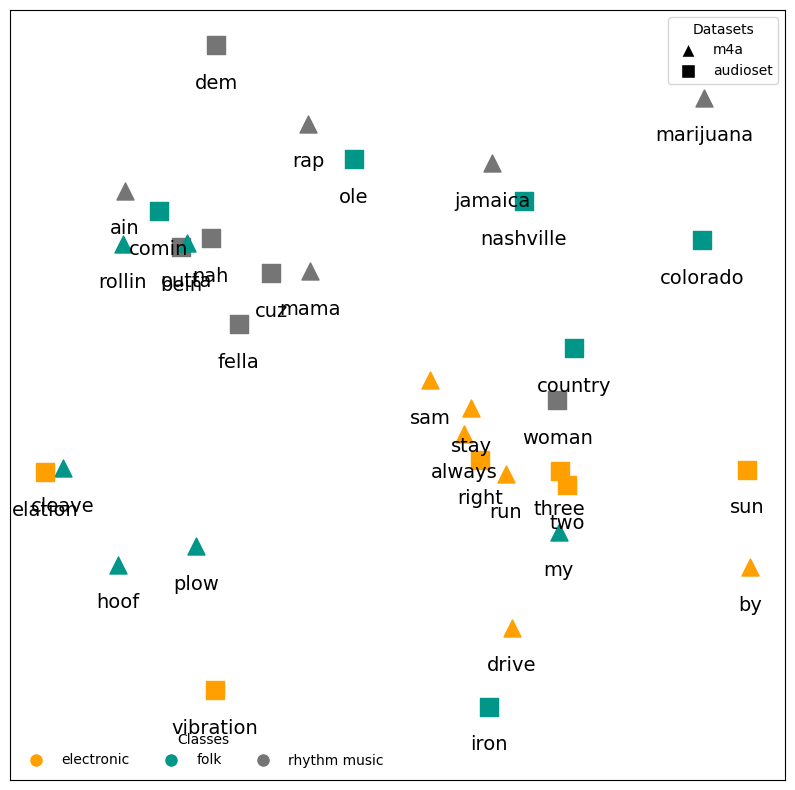

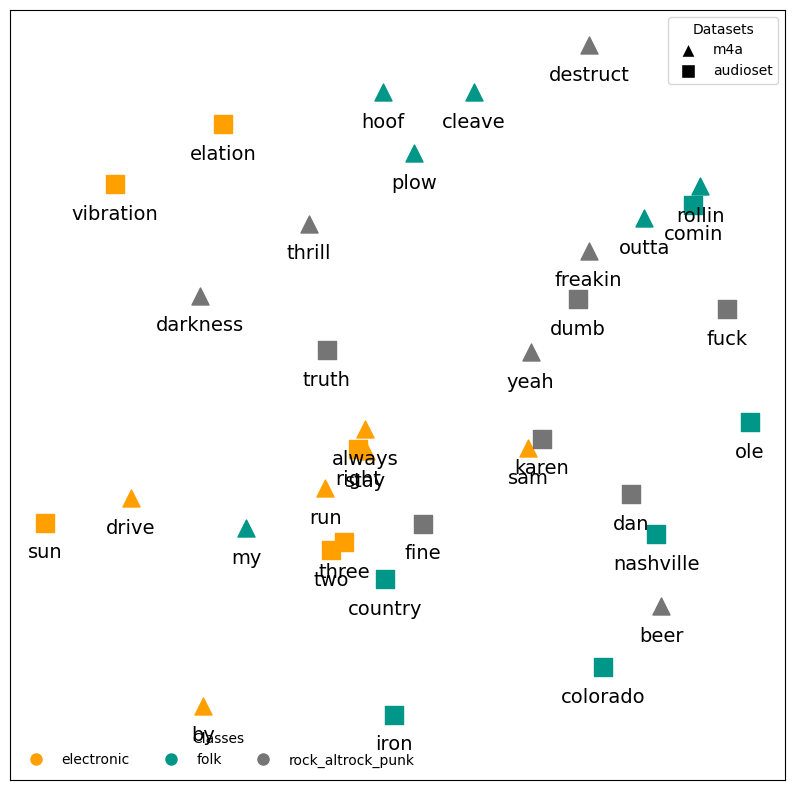

...

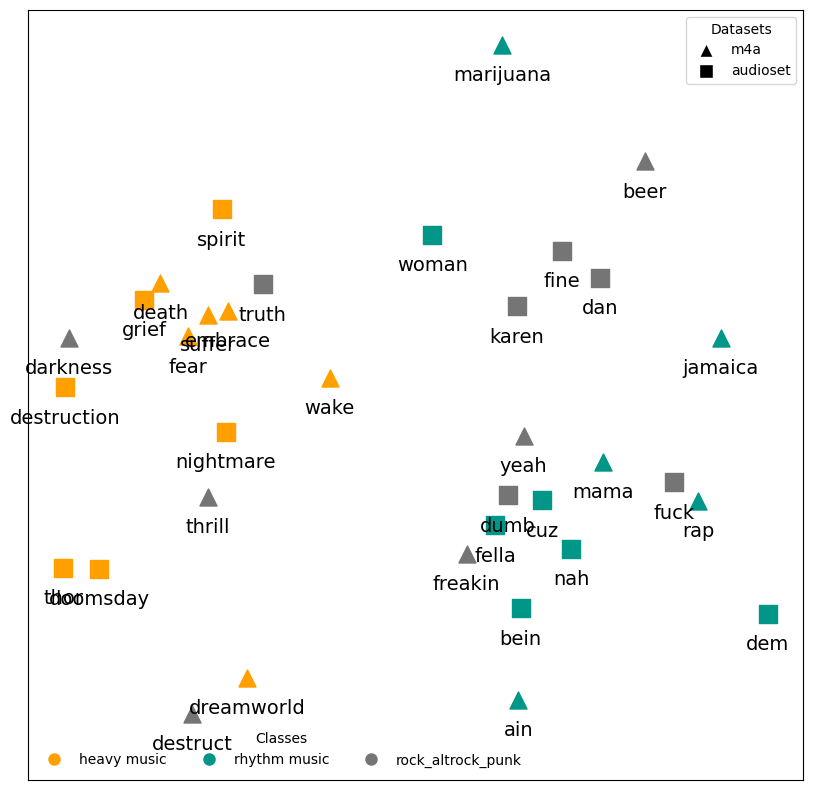

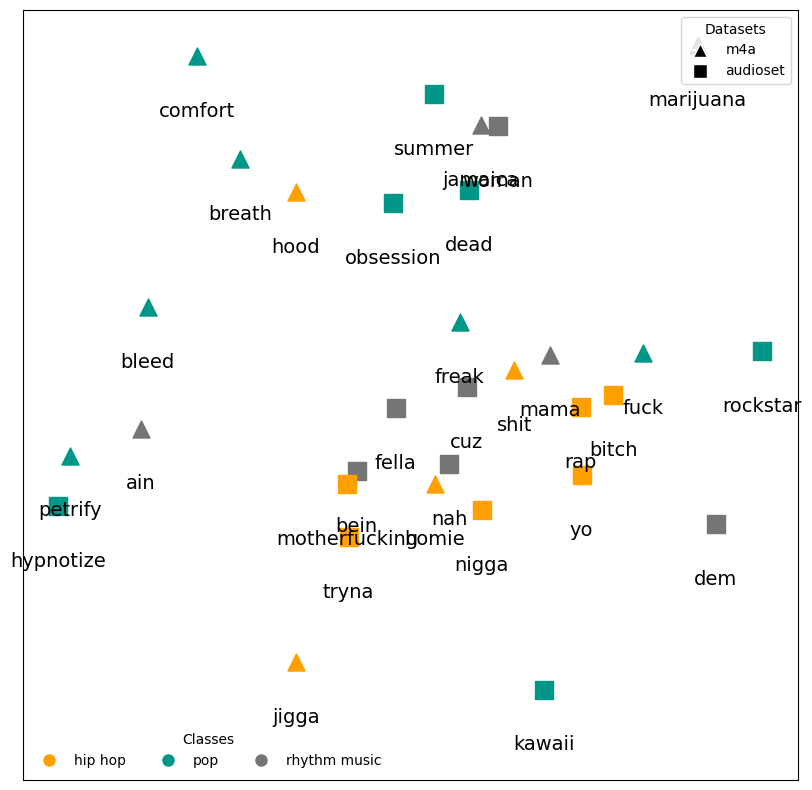

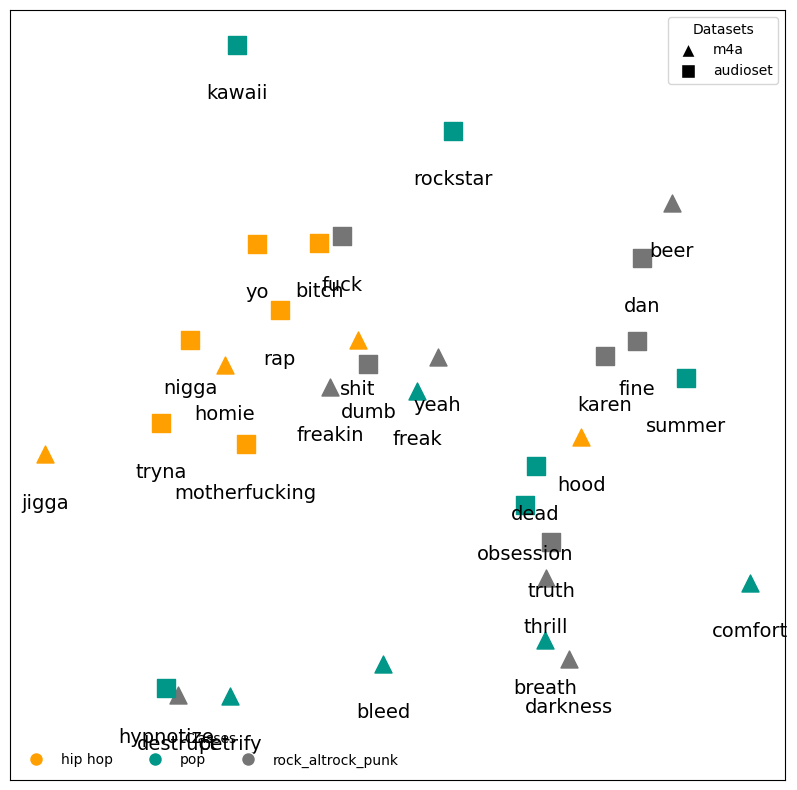

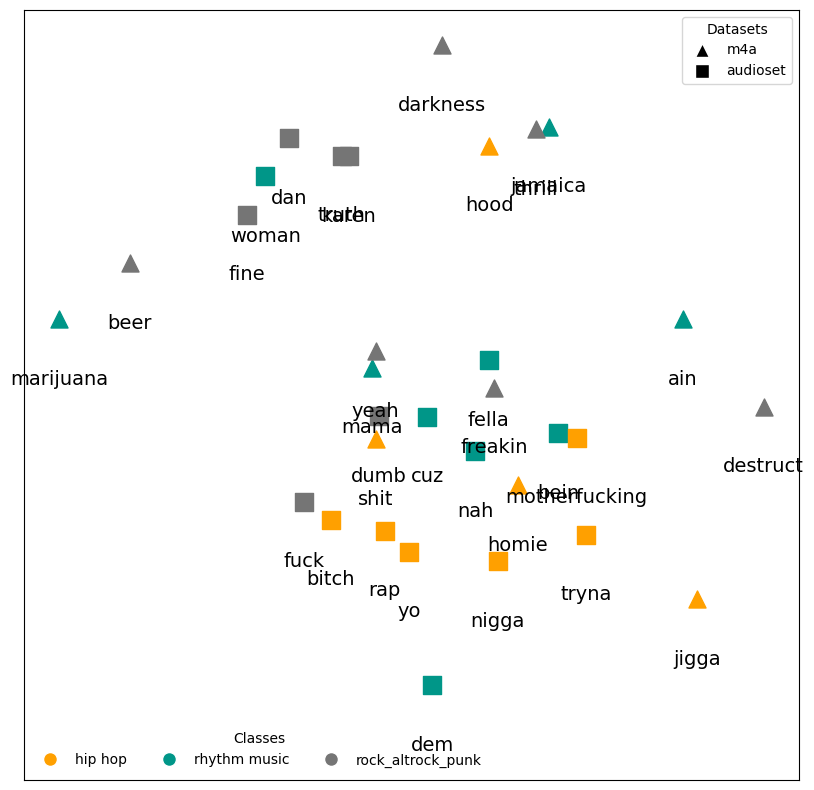

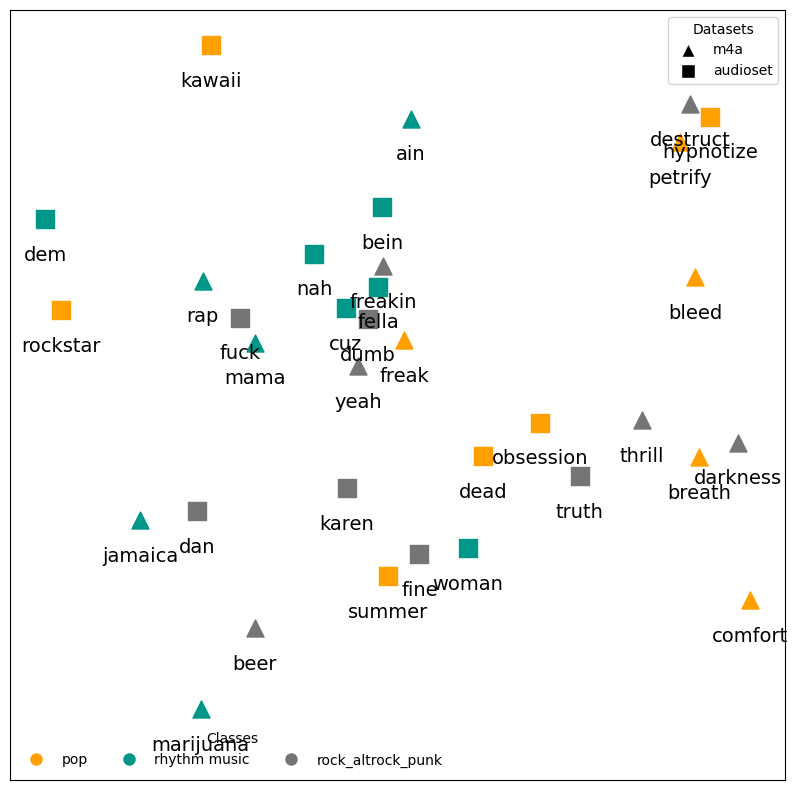

In [54]:
plot_feature_importance_dual_datasets_3by3(top_features_per_class_m4a, top_features_per_class_audioset, glove_embeddings, secondary_label_encoder, N=6, repo_path='../images/3vs')